In [1]:
# Importing the libraries
import warnings
warnings.filterwarnings('ignore')

import numpy as np
import matplotlib.pyplot as plt
import pandas as pd
import seaborn as sns

pd.set_option('display.max_rows',None)
pd.set_option('display.max_columns',None)

## Math Grades

In [2]:
# Importing the dataset
df_math = pd.read_csv('/Users/diogomonteiro/Documents/Education/CCT/Summer BootCamp/Diploma in Predictive Analytics/CA/Question 2/student+performance/student-mat.csv', delimiter=';', quotechar='"')
df_math.head()

,school,sex,age,address,famsize,Pstatus,Medu,Fedu,Mjob,Fjob,reason,guardian,traveltime,studytime,failures,schoolsup,famsup,paid,activities,nursery,higher,internet,romantic,famrel,freetime,goout,Dalc,Walc,health,absences,G1,G2,G3
0,GP,F,18,U,GT3,A,4,4,at_home,teacher,course,mother,2,2,0,yes,no,no,no,yes,yes,no,no,4,3,4,1,1,3,6,5,6,6
1,GP,F,17,U,GT3,T,1,1,at_home,other,course,father,1,2,0,no,yes,no,no,no,yes,yes,no,5,3,3,1,1,3,4,5,5,6
2,GP,F,15,U,LE3,T,1,1,at_home,other,other,mother,1,2,3,yes,no,yes,no,yes,yes,yes,no,4,3,2,2,3,3,10,7,8,10
3,GP,F,15,U,GT3,T,4,2,health,services,home,mother,1,3,0,no,yes,yes,yes,yes,yes,yes,yes,3,2,2,1,1,5,2,15,14,15
4,GP,F,16,U,GT3,T,3,3,other,other,home,father,1,2,0,no,yes,yes,no,yes,yes,no,no,4,3,2,1,2,5,4,6,10,10


In [3]:
df_math.shape

(395, 33)

In [4]:
df_math.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 395 entries, 0 to 394
Data columns (total 33 columns):
 #   Column      Non-Null Count  Dtype 
---  ------      --------------  ----- 
 0   school      395 non-null    object
 1   sex         395 non-null    object
 2   age         395 non-null    int64 
 3   address     395 non-null    object
 4   famsize     395 non-null    object
 5   Pstatus     395 non-null    object
 6   Medu        395 non-null    int64 
 7   Fedu        395 non-null    int64 
 8   Mjob        395 non-null    object
 9   Fjob        395 non-null    object
 10  reason      395 non-null    object
 11  guardian    395 non-null    object
 12  traveltime  395 non-null    int64 
 13  studytime   395 non-null    int64 
 14  failures    395 non-null    int64 
 15  schoolsup   395 non-null    object
 16  famsup      395 non-null    object
 17  paid        395 non-null    object
 18  activities  395 non-null    object
 19  nursery     395 non-null    object
 20  higher    

In [5]:
df_math.describe().T

,count,mean,std,min,25%,50%,75%,max
age,395.0,16.696203,1.276043,15.0,16.0,17.0,18.0,22.0
Medu,395.0,2.749367,1.094735,0.0,2.0,3.0,4.0,4.0
Fedu,395.0,2.521519,1.088201,0.0,2.0,2.0,3.0,4.0
traveltime,395.0,1.448101,0.697505,1.0,1.0,1.0,2.0,4.0
studytime,395.0,2.035443,0.839240,1.0,1.0,2.0,2.0,4.0
failures,395.0,0.334177,0.743651,0.0,0.0,0.0,0.0,3.0
famrel,395.0,3.944304,0.896659,1.0,4.0,4.0,5.0,5.0
freetime,395.0,3.235443,0.998862,1.0,3.0,3.0,4.0,5.0
goout,395.0,3.108861,1.113278,1.0,2.0,3.0,4.0,5.0
Dalc,395.0,1.481013,0.890741,1.0,1.0,1.0,2.0,5.0


In [6]:
df_math.isnull().sum()

school        0
sex           0
age           0
address       0
famsize       0
Pstatus       0
Medu          0
Fedu          0
Mjob          0
Fjob          0
reason        0
guardian      0
traveltime    0
studytime     0
failures      0
schoolsup     0
famsup        0
paid          0
activities    0
nursery       0
higher        0
internet      0
romantic      0
famrel        0
freetime      0
goout         0
Dalc          0
Walc          0
health        0
absences      0
G1            0
G2            0
G3            0
dtype: int64

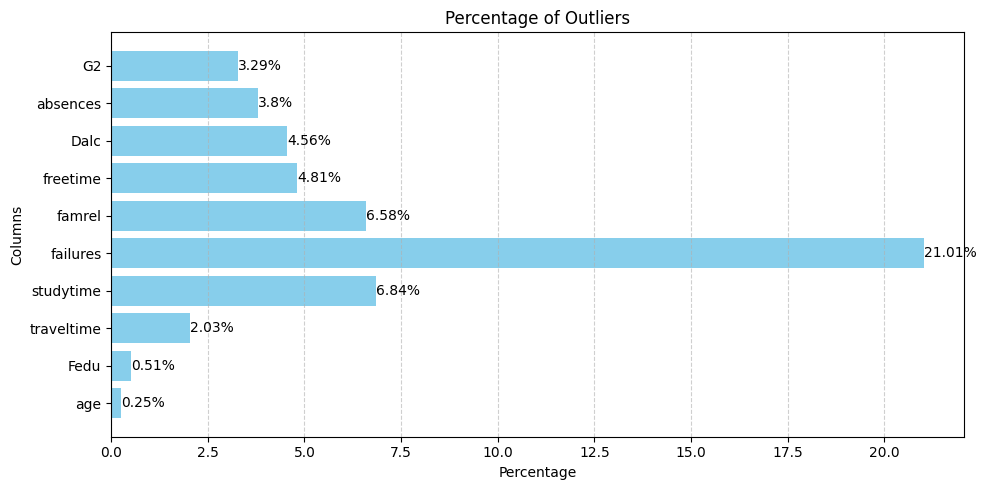

In [7]:
def calculate_percentage_of_outliers(df_math, column_name, criterion='tukey'):
    # Calculating Interquartile Range
    Q1 = df_math[column_name].quantile(0.25)
    Q3 = df_math[column_name].quantile(0.75)
    IQR = Q3 - Q1

    if criterion == 'tukey':
        # Identifying outliers
        outliers = ((df_math[column_name] < (Q1 - 1.5 * IQR)) | (df_math[column_name] > (Q3 + 1.5 * IQR)))
    else:
        raise ValueError("Unsupported criterion. Use 'tukey'.")

    # Calculating the percentage of outliers
    percentage_of_outliers = round((outliers.sum() / len(df_math)) * 100, 2)

    return percentage_of_outliers

# Iterating over numerical columns
numerical_columns = df_math.select_dtypes(include=[np.number]).columns

percentage_outliers_tukey = []
columns_with_outliers = []

for column in numerical_columns:
    percentage_tukey = calculate_percentage_of_outliers(df_math, column)
    if percentage_tukey != 0:
        percentage_outliers_tukey.append(percentage_tukey)
        columns_with_outliers.append(column)

# Plotting the results for columns with percentages
plt.figure(figsize=(10, 5))

bars_tukey = plt.barh(np.arange(len(columns_with_outliers)), percentage_outliers_tukey, color='skyblue', label="Tukey's Criterion")

# Adding percentage values to the bars
for i, bar in enumerate(bars_tukey):
    plt.text(bar.get_width(), bar.get_y() + bar.get_height()/2, f'{bar.get_width()}%', ha='left', va='center', color='black')

plt.yticks(np.arange(len(columns_with_outliers)), columns_with_outliers)
plt.xlabel('Percentage')
plt.ylabel('Columns')
plt.title('Percentage of Outliers')
plt.grid(axis='x', linestyle='--', alpha=0.6)
plt.tight_layout()
plt.show()


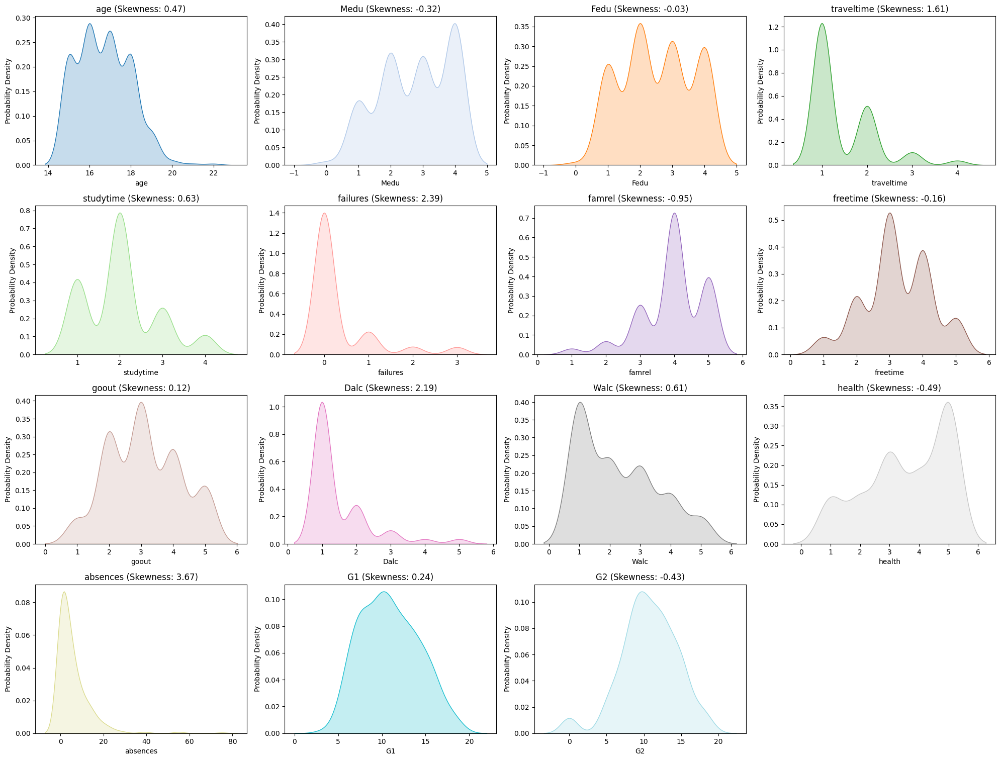

In [8]:
numerical_columns = df_math.select_dtypes(include=['number'])

# Generating a list of colors using a colormap
cmap = plt.cm.get_cmap('tab20', 15)
colors = [cmap(i) for i in range(15)]

# Calculating skewness for each column
skewness = df_math[numerical_columns.columns].skew()

# Plotting the KDE distribution for each column
plt.figure(figsize=(20, 60))
for i, (column, color) in enumerate(zip(numerical_columns.columns, colors), 1):
    plt.subplot(16, 4, i)
    sns.kdeplot(data=df_math, x=column, shade=True, color=color, label=f'{column}')
    plt.xlabel(column)
    plt.ylabel('Probability Density')
    plt.title(f'{column} (Skewness: {skewness[column]:.2f})')

plt.tight_layout()
plt.show()

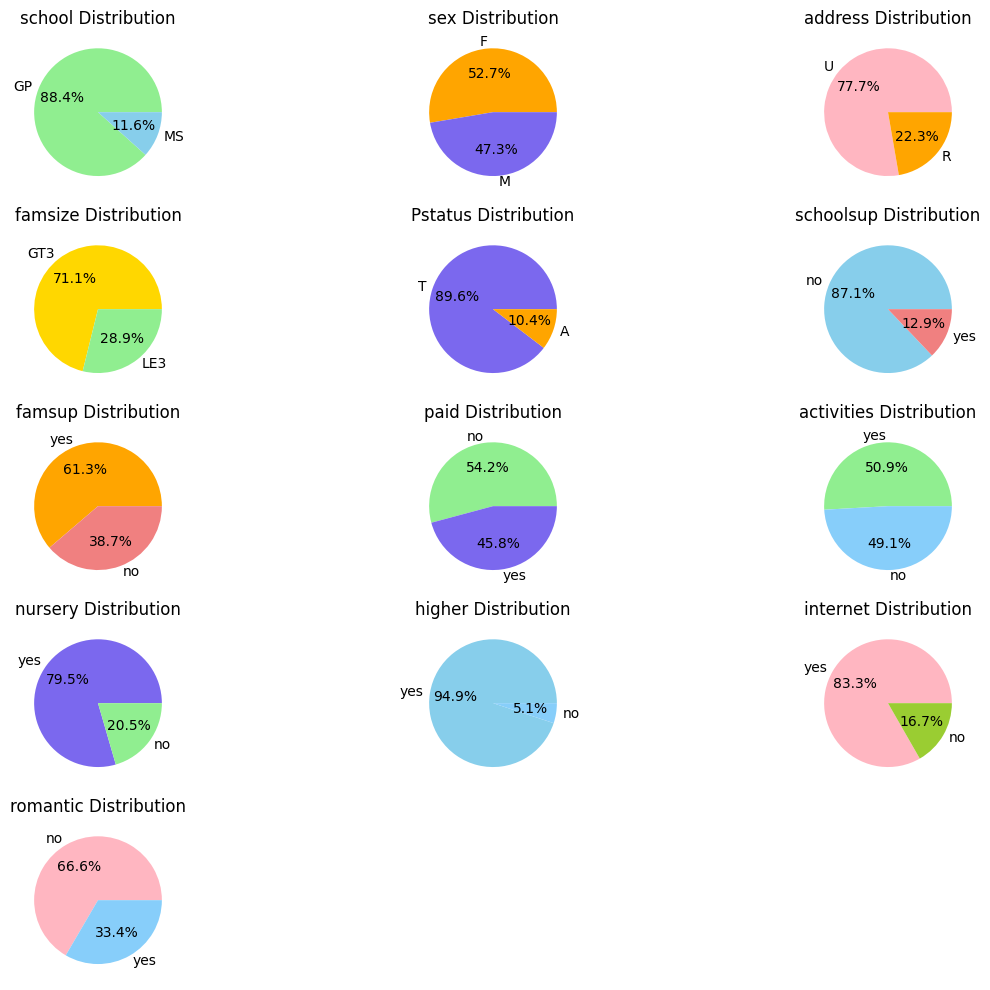

In [9]:
import random

# Identifying features with exactly 2 unique values
binary_features = []
for column in df_math.columns:
    if df_math[column].nunique() == 2:
        binary_features.append(column)

# Defining colors
colors = ['skyblue', 'lightcoral', 'lightgreen', 'orange', 'gold', 'mediumslateblue', 'lightpink', 'yellowgreen', 'lightskyblue']

# Shuffling colors to randomise selection
random.shuffle(colors)

# Plotting features in pie charts with different colors
num_plots = len(binary_features)
num_rows = (num_plots + 2) // 3  # 3 plots per row

plt.figure(figsize=(12, 2 * num_rows))

# List to store used color pairs
used_color_pairs = []

for i, feature in enumerate(binary_features, 1):
    plt.subplot(num_rows, 3, i)
    feature_counts = df_math[feature].value_counts()
    
    # Selecting two unique colors that haven't been used together before
    while True:
        selected_colors = random.sample(colors, 2)
        if tuple(selected_colors) not in used_color_pairs:
            used_color_pairs.append(tuple(selected_colors))
            break
    
    plt.pie(feature_counts, labels=feature_counts.index, autopct='%1.1f%%', colors=selected_colors)
    plt.title(f'{feature} Distribution')

plt.tight_layout()
plt.show()

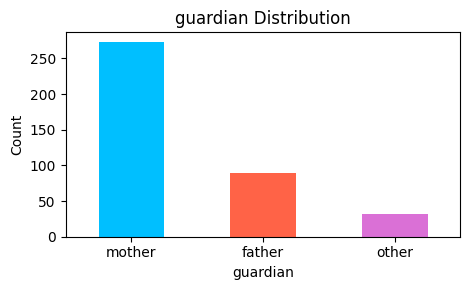

In [10]:
# Identifying features with exactly 2 unique values
binary_features = []
for column in df_math.columns:
    if df_math[column].nunique() == 3:
        binary_features.append(column)

# Defining colors for bar plots
colors = ['orchid', 'lightcoral', 'deepskyblue', 'limegreen', 'gold', 'mediumslateblue', 'tomato']

# Shuffling colors to randomize selection
random.shuffle(colors)

# Plotting features in bar plots with different colors
num_plots = len(binary_features)
num_rows = (num_plots + 2) // 3

plt.figure(figsize=(13, 3 * num_rows))

# List to store used color pairs
used_color_pairs = []

for i, feature in enumerate(binary_features, 1):
    plt.subplot(num_rows, 3, i)
    feature_counts = df_math[feature].value_counts()
    
    # Selecting unique colors that haven't been used together before
    while True:
        selected_colors = random.sample(colors, 3)
        if tuple(selected_colors) not in used_color_pairs:
            used_color_pairs.append(tuple(selected_colors))
            break
    
    feature_counts.plot(kind='bar', color=selected_colors)
    plt.xticks(rotation=0)
    plt.xlabel(feature)
    plt.ylabel('Count')
    plt.title(f'{feature} Distribution')

plt.tight_layout()
plt.show()

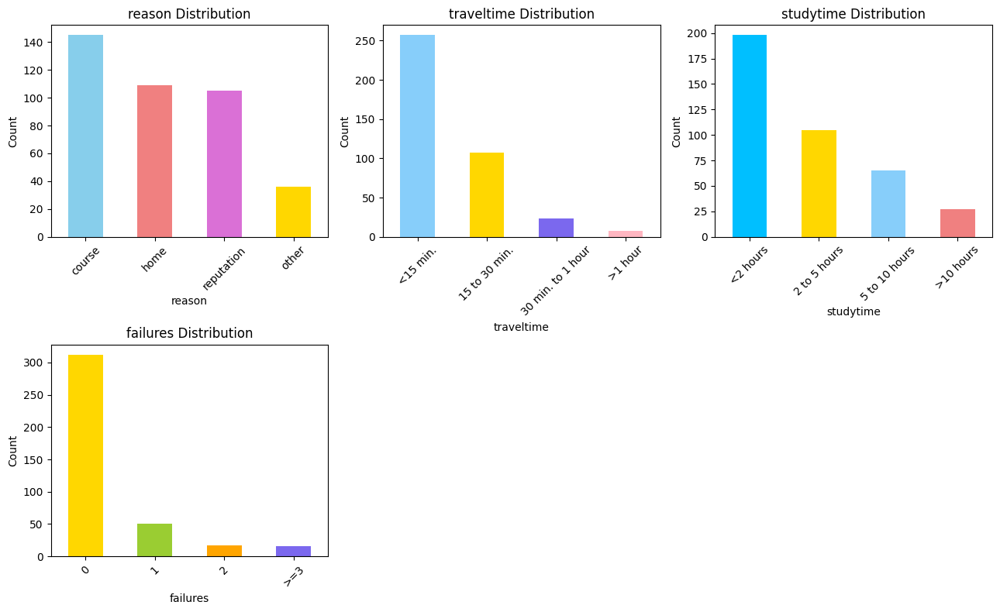

In [11]:
# Identifying features with exactly 2 unique values
binary_features = []
for column in df_math.columns:
    if df_math[column].nunique() == 4:
        binary_features.append(column)

# Defining colors for bar plots
colors = [
    'skyblue', 'lightcoral', 'lightgreen', 'orange', 'gold', 'mediumslateblue', 'lightpink', 'yellowgreen', 'lightskyblue',
    'orchid', 'lightcoral', 'deepskyblue', 'limegreen', 'gold', 'mediumslateblue', 'tomato'
]

# Shuffling colors to randomize selection
random.shuffle(colors)

# Correcting order for plotting
feature_order = {
    'traveltime': ['<15 min.', '15 to 30 min.', '30 min. to 1 hour', '>1 hour'],
    'studytime': ['<2 hours', '2 to 5 hours', '5 to 10 hours', '>10 hours'],
    'failures': ['0', '1', '2', '>=3']
}

# Plotting features in bar plots with different colors
num_plots = len(binary_features)
num_rows = (num_plots + 2) // 3

plt.figure(figsize=(13, 4 * num_rows))

# List to store used color pairs
used_color_pairs = []

for i, feature in enumerate(binary_features, 1):
    plt.subplot(num_rows, 3, i)
    feature_counts = df_math[feature].value_counts()
    
    # Selecting colors based on order and shuffle
    selected_colors = random.sample(colors, 4)
    
    # Plotting the bar chart
    feature_counts.plot(kind='bar', color=selected_colors)
    
    # Set x-axis ticks and labels in the correct order
    if feature in feature_order:
        plt.xticks(range(len(feature_order[feature])), feature_order[feature])
    
    plt.xlabel(feature)
    plt.ylabel('Count')
    plt.xticks(rotation=45)
    plt.title(f'{feature} Distribution')

plt.tight_layout()
plt.show()

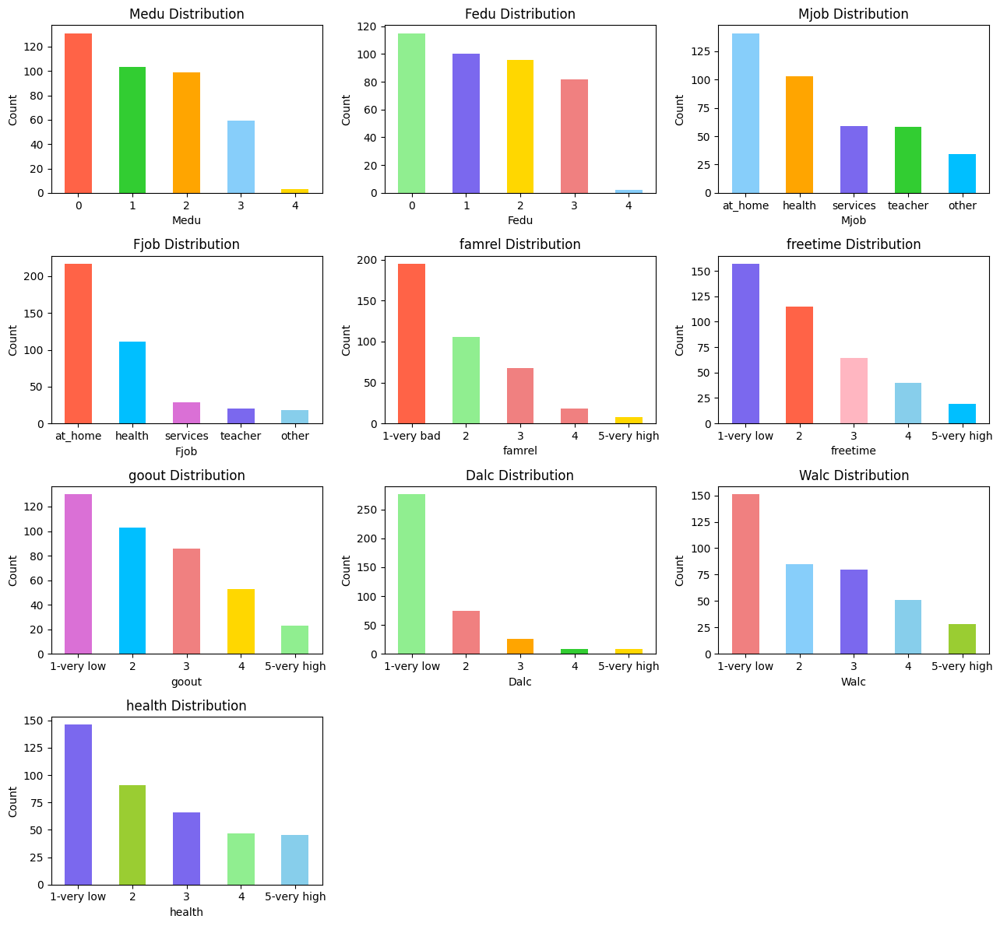

In [12]:
# Identifying features with exactly 5 unique values
features_with_5_values = []
for column in df_math.columns:
    if df_math[column].nunique() == 5:
        features_with_5_values.append(column)

# Defining colors for bar plots
colors = [
    'skyblue', 'lightcoral', 'lightgreen', 'orange', 'gold', 'mediumslateblue', 'lightpink', 'yellowgreen', 'lightskyblue',
    'orchid', 'lightcoral', 'deepskyblue', 'limegreen', 'gold', 'mediumslateblue', 'tomato'
]

# Shuffling colors to randomize selection
random.shuffle(colors)

# Correcting order for plotting
feature_order = {
    'famsize': ['LE3', 'GT3'],
    'Pstatus': ['T', 'A'],
    'Medu': [0, 1, 2, 3, 4],
    'Fedu': [0, 1, 2, 3, 4],
    'Mjob': ['at_home', 'health', 'services', 'teacher', 'other'],
    'Fjob': ['at_home', 'health', 'services', 'teacher', 'other'],
    'famrel': ["1-very bad", 2, 3, 4, '5-very high'],
    'freetime': ['1-very low', 2, 3, 4, '5-very high'],
    'goout': ['1-very low', 2, 3, 4, '5-very high'],
    'Dalc': ['1-very low', 2, 3, 4, '5-very high'],
    'Walc': ['1-very low', 2, 3, 4, '5-very high'],
    'health': ['1-very low', 2, 3, 4, '5-very high']
}

# Plotting features in bar plots with different colors
num_plots = len(features_with_5_values)
num_rows = (num_plots + 2) // 3

plt.figure(figsize=(13, 3 * num_rows))

# List to store used color sets
used_color_sets = []

for i, feature in enumerate(features_with_5_values, 1):
    plt.subplot(num_rows, 3, i)
    feature_counts = df_math[feature].value_counts()
    
    # Selecting colors based on order and shuffle
    selected_colors = random.sample(colors, 5)
    
    # Plotting the bar chart
    feature_counts.plot(kind='bar', color=selected_colors)
    
    # Set x-axis ticks and labels in the correct order
    if feature in feature_order:
        plt.xticks(range(len(feature_order[feature])), feature_order[feature])
    
    plt.xlabel(feature)
    plt.ylabel('Count')
    plt.xticks(rotation=0)
    plt.title(f'{feature} Distribution')

plt.tight_layout()
plt.show()

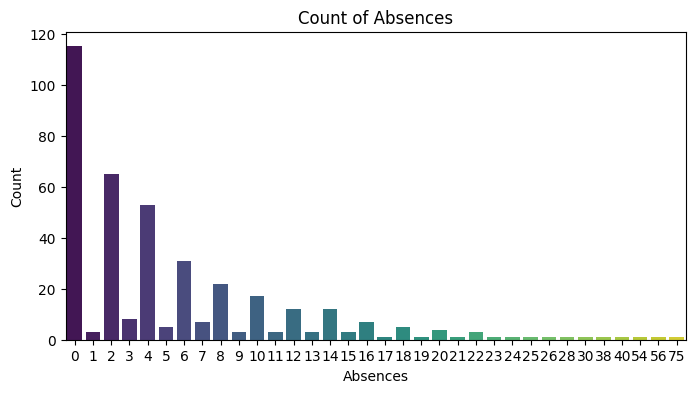

In [13]:
# Plotting the count of absences
plt.figure(figsize=(8, 4))
sns.countplot(data=df_math, x='absences', palette='viridis')
plt.xlabel('Absences')
plt.ylabel('Count')
plt.title('Count of Absences')
plt.show()

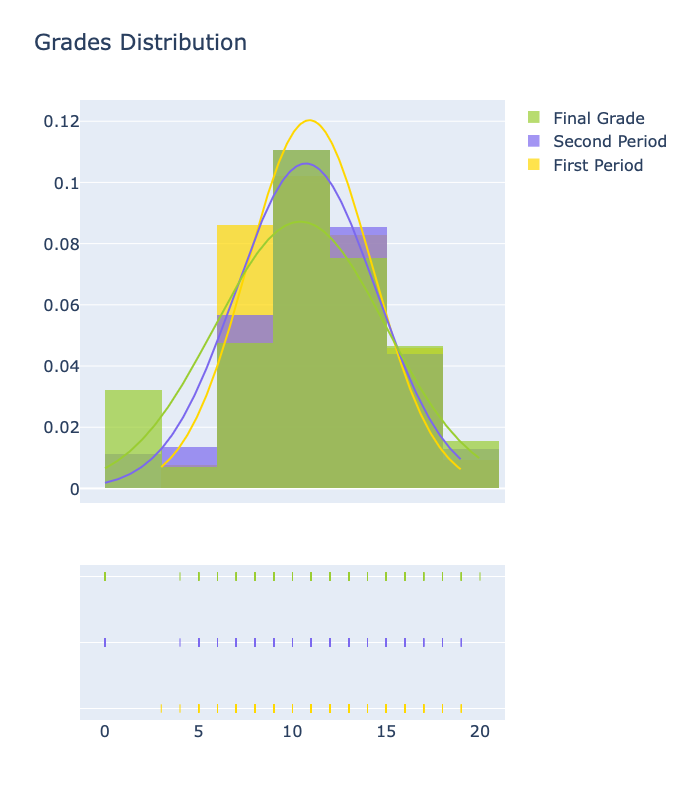

In [14]:
import chart_studio.plotly as py
import plotly.figure_factory as ff
from plotly.offline import download_plotlyjs, init_notebook_mode, iplot
from plotly.graph_objs import *
init_notebook_mode()

# Adding histogram data
x1 = df_math['G1'].values.tolist() 
x2 = df_math['G2'].values.tolist()  
x3 = df_math['G3'].values.tolist()    

# Grouping data together
hist_data = [x1, x2, x3]
group_labels = ['First Period', 'Second Period', 'Final Grade']
colors = ["gold", "mediumslateblue", "yellowgreen"]

# Creating distplot with custom bin_size
fig = ff.create_distplot(hist_data, group_labels, bin_size=3, curve_type='normal', colors=colors)
fig['layout'].update(
    title='Grades Distribution',
    font=dict(size=16),
    width=1100,
    height=800
)

iplot(fig)


In [15]:
df = df_math.copy()

# Mapping dictionary according to requirements
mapping = {
    'school': {'GP': 0, 'MS': 1},
    'sex': {'F': 0, 'M': 1},
    'address': {'U': 0, 'R': 1},
    'famsize': {'LE3': 0, 'GT3': 1},
    'Pstatus': {'T': 0, 'A': 1},
    'Mjob': {'at_home': 0, 'teacher': 1, 'health': 2, 'services': 3, 'other': 4},
    'Fjob': {'teacher': 0, 'health': 1, 'services': 2, 'at_home': 3, 'other': 4},
    'reason': {'home': 0, 'reputation': 1, 'course': 2, 'other': 3},
    'guardian': {'mother': 0, 'father': 1, 'other': 2},
    'schoolsup': {'no': 0, 'yes': 1},
    'famsup': {'no': 0, 'yes': 1},
    'paid': {'no': 0, 'yes': 1},
    'activities': {'no': 0, 'yes': 1},
    'nursery': {'no': 0, 'yes': 1},
    'higher': {'no': 0, 'yes': 1},
    'internet': {'no': 0, 'yes': 1},
    'romantic': {'no': 0, 'yes': 1}
}

# Applying mapping to each column
for col, map_dict in mapping.items():
    df[col+'_enc'] = df[col].map(map_dict)

# Droping original categorical columns
df.drop(list(mapping.keys()), axis=1, inplace=True)

# Displaying
df.head()

,age,Medu,Fedu,traveltime,studytime,failures,famrel,freetime,goout,Dalc,Walc,health,absences,G1,G2,G3,school_enc,sex_enc,address_enc,famsize_enc,Pstatus_enc,Mjob_enc,Fjob_enc,reason_enc,guardian_enc,schoolsup_enc,famsup_enc,paid_enc,activities_enc,nursery_enc,higher_enc,internet_enc,romantic_enc
0,18,4,4,2,2,0,4,3,4,1,1,3,6,5,6,6,0,0,0,1,1,0,0,2,0,1,0,0,0,1,1,0,0
1,17,1,1,1,2,0,5,3,3,1,1,3,4,5,5,6,0,0,0,1,0,0,4,2,1,0,1,0,0,0,1,1,0
2,15,1,1,1,2,3,4,3,2,2,3,3,10,7,8,10,0,0,0,0,0,0,4,3,0,1,0,1,0,1,1,1,0
3,15,4,2,1,3,0,3,2,2,1,1,5,2,15,14,15,0,0,0,1,0,2,2,0,0,0,1,1,1,1,1,1,1
4,16,3,3,1,2,0,4,3,2,1,2,5,4,6,10,10,0,0,0,1,0,4,4,0,1,0,1,1,0,1,1,0,0


In [16]:
from scipy import stats

# Droping 'G1' and 'G2', then selecting numerical columns
numerical_columns = df.drop(['G1', 'G2'], axis=1).select_dtypes(include='number').columns

# List to store features with correlation >= 0.2 and <=-0.2 and their direction
significant_features = []

# Looping through numerical columns and calculate correlation with 'G3'
for column in numerical_columns:
    if column != 'G3': 
        pearson_coef, p_value = stats.pearsonr(df[column], df['G3'])
        
        # Determining the direction (positive or negative)
        if pearson_coef > 0:
            correlation_direction = 'Positive'
        elif pearson_coef < 0:
            correlation_direction = 'Negative'
        else:
            correlation_direction = 'No correlation'
        
        # Printing analysis details
        print(f'Analysis between {column} and G3:')
        print(f'Pearson correlation coefficient: {pearson_coef:.2f}')
        print(f'Correlation Direction: {correlation_direction}')
        print(f'P-value: {p_value:.3f}')
        
        # Determining the strength of the correlation
        if abs(pearson_coef) >= 0.7:
            print('Correlation Coefficient: Large relationship')
        elif 0.4 <= abs(pearson_coef) < 0.7:
            print('Correlation Coefficient: Moderate relationship')
        elif 0.3 <= abs(pearson_coef) < 0.4:
            print('Correlation Coefficient: Weak relationship')
        else:
            print('Correlation Coefficient: No significant relationship')
        
        # Determining the certainty level based on the p-value
        if p_value < 0.001:
            print('P-value: Strong certainty in the result')
        elif p_value < 0.05:
            print('P-value: Moderate certainty in the result')
        elif p_value < 0.1:
            print('P-value: Weak certainty in the result')
        else:
            print('P-value: No certainty in the result')
        
        print('\n')
        
        # Checking if correlation coefficient meets threshold and add to list
        if abs(pearson_coef) >= 0.2:
            significant_features.append((column, correlation_direction))
        elif abs(pearson_coef) <= -0.2:
            significant_features.append((column, correlation_direction))



Analysis between age and G3:
Pearson correlation coefficient: -0.16
Correlation Direction: Negative
P-value: 0.001
Correlation Coefficient: No significant relationship
P-value: Moderate certainty in the result


Analysis between Medu and G3:
Pearson correlation coefficient: 0.22
Correlation Direction: Positive
P-value: 0.000
Correlation Coefficient: No significant relationship
P-value: Strong certainty in the result


Analysis between Fedu and G3:
Pearson correlation coefficient: 0.15
Correlation Direction: Positive
P-value: 0.002
Correlation Coefficient: No significant relationship
P-value: Moderate certainty in the result


Analysis between traveltime and G3:
Pearson correlation coefficient: -0.12
Correlation Direction: Negative
P-value: 0.020
Correlation Coefficient: No significant relationship
P-value: Moderate certainty in the result


Analysis between studytime and G3:
Pearson correlation coefficient: 0.10
Correlation Direction: Positive
P-value: 0.052
Correlation Coefficient: No

In [17]:
# Printing significant features
print(f'Features with correlation coefficient >= 0.2 ot <= -0.2 with G3: {significant_features}')


Features with correlation coefficient >= 0.2 ot <= -0.2 with G3: [('Medu', 'Positive'), ('failures', 'Negative')]


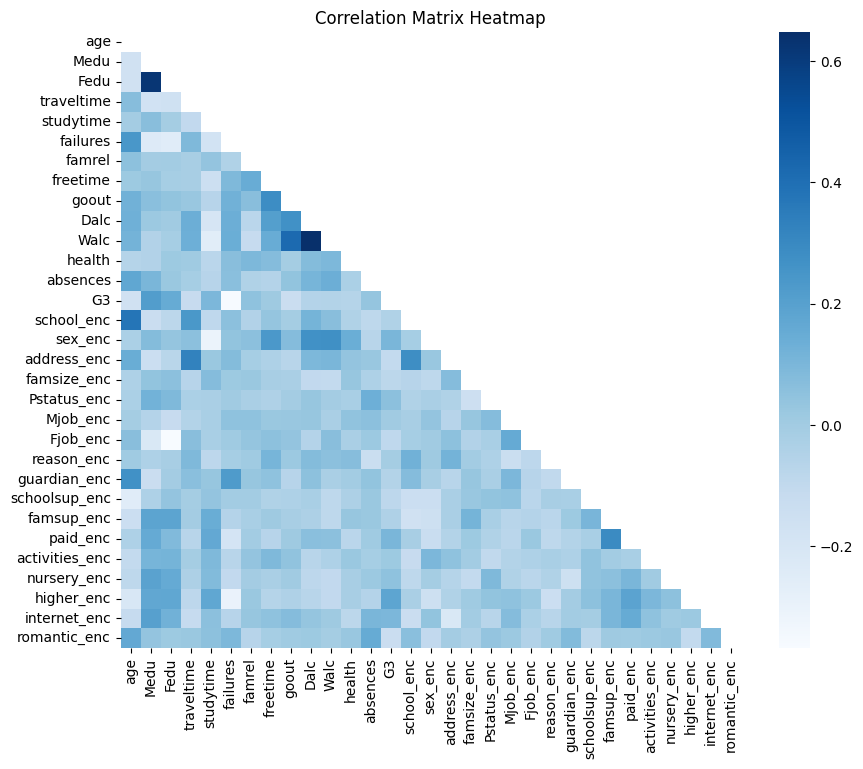

In [18]:
# Selecting numerical columns excluding 'G1' and 'G2'
numerical_columns = df.drop(['G1', 'G2'], axis=1)

# Calculating the correlation matrix
correlation_matrix = numerical_columns.corr()

plt.figure(figsize=(10, 8))
# Creating a mask to hide the upper triangle
mask = np.triu(np.ones_like(correlation_matrix, dtype=bool))

# Generating a heatmap with the mask
sns.heatmap(correlation_matrix, mask=mask, cmap='Blues', annot=True, fmt=".2f")

plt.title('Correlation Matrix Heatmap')
plt.show()

#### Attempting LR with best k features

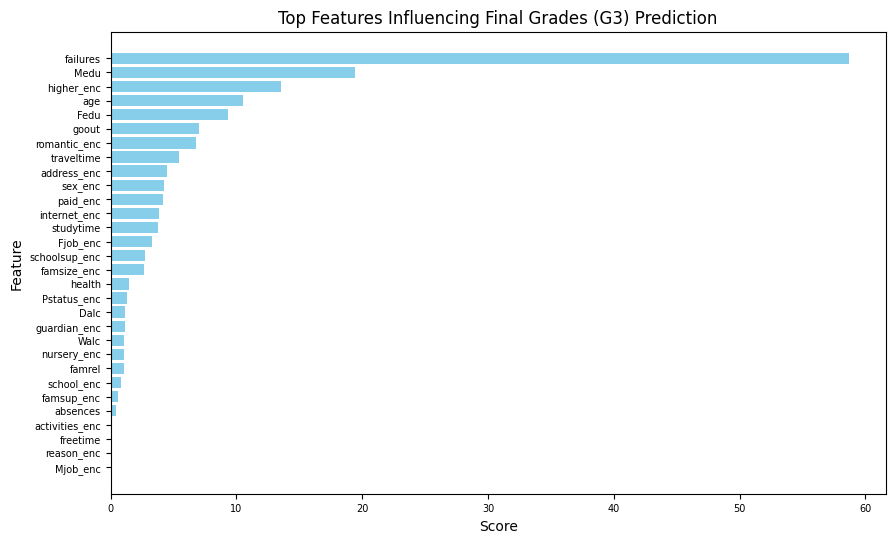

In [19]:
from sklearn.feature_selection import SelectKBest, chi2, f_regression

# Initializing SelectKBest
kbest = SelectKBest(score_func=f_regression, k='all') 

# Splitting data into X y
X = df.drop(['G3','G1', 'G2'], axis=1)  
y = df['G3']

# Fiting SelectKBest on features and target variable
kbest.fit(X, y)

# Geting the scores of each feature
scores = kbest.scores_

# Sorting the features based on scores
sorted_indices = np.argsort(scores)[::-1]  # Sort in descending order

# Plotting the top k features with scores
top_k = 30  # number of top features to plot
top_features = X.columns[sorted_indices[:top_k]]
top_scores = scores[sorted_indices[:top_k]]

plt.figure(figsize=(10, 6))
plt.barh(top_features, top_scores, color='skyblue')
plt.xlabel('Score')
plt.ylabel('Feature')
plt.xticks(fontsize = 7)
plt.yticks(fontsize = 7)
plt.title('Top Features Influencing Final Grades (G3) Prediction')
plt.gca().invert_yaxis()  # Invert y-axis to have the highest score at the top
plt.show()

In [20]:
top_features

Index(['failures', 'Medu', 'higher_enc', 'age', 'Fedu', 'goout',
       'romantic_enc', 'traveltime', 'address_enc', 'sex_enc', 'paid_enc',
       'internet_enc', 'studytime', 'Fjob_enc', 'schoolsup_enc', 'famsize_enc',
       'health', 'Pstatus_enc', 'Dalc', 'guardian_enc', 'Walc', 'nursery_enc',
       'famrel', 'school_enc', 'famsup_enc', 'absences', 'activities_enc',
       'freetime', 'reason_enc', 'Mjob_enc'],
      dtype='object')

In [21]:
top_features = [
    'failures', 'Medu', 'higher_enc', 'age', 'Fedu', 'goout',
    'romantic_enc', 'traveltime', 'address_enc', 'sex_enc', 'paid_enc',
    'internet_enc', 'studytime', 'Fjob_enc', 'schoolsup_enc', 'famsize_enc',
    'health', 'Pstatus_enc', 'Dalc', 'guardian_enc', 'Walc', 'nursery_enc',
    'famrel', 'school_enc', 'famsup_enc', 'absences','G3']

# Checking which features are not present in the dataset if any
missing_features = [feature for feature in top_features if feature not in df.columns]
if missing_features:
    print(f"These features are missing from the dataset: {missing_features}")
else:
    print('No missing features')

# Filtering the dataset to include only the top features that are present
available_features = [feature for feature in top_features if feature in df.columns]
filtered_df = df[available_features]

filtered_df.head()

No missing features


,failures,Medu,higher_enc,age,Fedu,goout,romantic_enc,traveltime,address_enc,sex_enc,paid_enc,internet_enc,studytime,Fjob_enc,schoolsup_enc,famsize_enc,health,Pstatus_enc,Dalc,guardian_enc,Walc,nursery_enc,famrel,school_enc,famsup_enc,absences,G3
0,0,4,1,18,4,4,0,2,0,0,0,0,2,0,1,1,3,1,1,0,1,1,4,0,0,6,6
1,0,1,1,17,1,3,0,1,0,0,0,1,2,4,0,1,3,0,1,1,1,0,5,0,1,4,6
2,3,1,1,15,1,2,0,1,0,0,1,1,2,4,1,0,3,0,2,0,3,1,4,0,0,10,10
3,0,4,1,15,2,2,1,1,0,0,1,1,3,2,0,1,5,0,1,0,1,1,3,0,1,2,15
4,0,3,1,16,3,2,0,1,0,0,1,0,2,4,0,1,5,0,1,1,2,1,4,0,1,4,10


In [22]:
# Selecting X and y

X = df.iloc[:,:-1].values
y = df.iloc[:,-1].values

In [23]:
# Splitting the data into training and testing sets

from sklearn.model_selection import train_test_split
X_train, X_test, y_train, y_test = train_test_split(X,y,test_size = 0.20, random_state = 0)

In [24]:
# Defining the model --> Linear Regression

from sklearn.linear_model import LinearRegression
regressor = LinearRegression()
regressor.fit(X_train, y_train)

LinearRegression()

In [25]:
y_pred = regressor.predict(X_test)

In [26]:
# Accuracy of this model to try to make predictions? --> r^2 r-square

regressor.score(X_train,y_train)

0.11133192736122954

#### Attempting LR with all features

In [27]:
df.head(1)

,age,Medu,Fedu,traveltime,studytime,failures,famrel,freetime,goout,Dalc,Walc,health,absences,G1,G2,G3,school_enc,sex_enc,address_enc,famsize_enc,Pstatus_enc,Mjob_enc,Fjob_enc,reason_enc,guardian_enc,schoolsup_enc,famsup_enc,paid_enc,activities_enc,nursery_enc,higher_enc,internet_enc,romantic_enc
0,18,4,4,2,2,0,4,3,4,1,1,3,6,5,6,6,0,0,0,1,1,0,0,2,0,1,0,0,0,1,1,0,0


In [28]:
df.columns

Index(['age', 'Medu', 'Fedu', 'traveltime', 'studytime', 'failures', 'famrel',
       'freetime', 'goout', 'Dalc', 'Walc', 'health', 'absences', 'G1', 'G2',
       'G3', 'school_enc', 'sex_enc', 'address_enc', 'famsize_enc',
       'Pstatus_enc', 'Mjob_enc', 'Fjob_enc', 'reason_enc', 'guardian_enc',
       'schoolsup_enc', 'famsup_enc', 'paid_enc', 'activities_enc',
       'nursery_enc', 'higher_enc', 'internet_enc', 'romantic_enc'],
      dtype='object')

In [29]:
# Define the new order of column names
new_order = [
    'age', 'Medu', 'Fedu', 'traveltime', 'studytime', 'failures', 'famrel',
    'freetime', 'goout', 'Dalc', 'Walc', 'health', 'absences', 
    'school_enc', 'sex_enc', 'address_enc', 'famsize_enc',
    'Pstatus_enc', 'Mjob_enc', 'Fjob_enc', 'reason_enc', 'guardian_enc',
    'schoolsup_enc', 'famsup_enc', 'paid_enc', 'activities_enc',
    'nursery_enc', 'higher_enc', 'internet_enc', 'romantic_enc', 'G1', 'G2', 'G3'
]

# Reindex the DataFrame with the new order of columns
df = df.reindex(columns=new_order)
df.head(1)

,age,Medu,Fedu,traveltime,studytime,failures,famrel,freetime,goout,Dalc,Walc,health,absences,school_enc,sex_enc,address_enc,famsize_enc,Pstatus_enc,Mjob_enc,Fjob_enc,reason_enc,guardian_enc,schoolsup_enc,famsup_enc,paid_enc,activities_enc,nursery_enc,higher_enc,internet_enc,romantic_enc,G1,G2,G3
0,18,4,4,2,2,0,4,3,4,1,1,3,6,0,0,0,1,1,0,0,2,0,1,0,0,0,1,1,0,0,5,6,6


In [30]:
# Selecting X and y

X = df.iloc[:,:-1].values
y = df.iloc[:,-1].values

# Splitting the data into training and testing sets
X_train, X_test, y_train, y_test = train_test_split(X,y,test_size = 0.20, random_state = 0)

# Initialising the regressor
regressor = LinearRegression()
regressor.fit(X_train, y_train)

y_pred = regressor.predict(X_test)

regressor.score(X_train,y_train)

0.8552292586897045

In [31]:
from sklearn.ensemble import RandomForestRegressor
from sklearn.tree import DecisionTreeRegressor
from sklearn.neighbors import KNeighborsRegressor
from sklearn.svm import SVR
from sklearn.metrics import mean_absolute_error, mean_squared_error, r2_score

# Selecting X and y
X = df.iloc[:,:-1].values
y = df.iloc[:,-1].values

# Splitting the data into training and testing sets
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.2, random_state=0)

# Initializing regressors
regressors = {
    'Linear Regression': LinearRegression(),
    'Random Forest': RandomForestRegressor(),
    'Decision Tree': DecisionTreeRegressor(),
    'KNN': KNeighborsRegressor(),
    'SVR': SVR()
}

# Training and evaluating regressors
results = {}
for name, reg in regressors.items():
    reg.fit(X_train, y_train)
    y_pred = reg.predict(X_test)
    
    mae = mean_absolute_error(y_test, y_pred)
    mse = mean_squared_error(y_test, y_pred)
    r2 = r2_score(y_test, y_pred)
    train_score = reg.score(X_train, y_train)  # Training R² score
    test_score = reg.score(X_test, y_test)  # Testing R² score
    
    results[name] = {
        'MAE': mae,
        'MSE': mse,
        'Train R² Score': train_score,
        'Test R² Score': test_score
    }

# Converting results to a DataFrame
results_df = pd.DataFrame(results).transpose()
results_df = results_df.reset_index().rename(columns={'index': 'Model'})
results_df

,Model,MAE,MSE,Train R² Score,Test R² Score
0,Linear Regression,1.587358,5.740844,0.855229,0.791914
1,Random Forest,1.080506,3.325096,0.981056,0.879477
2,Decision Tree,1.240506,5.924051,1.000000,0.785274
3,KNN,1.493671,4.905316,0.890560,0.822199
4,SVR,1.516012,6.473441,0.806615,0.765360


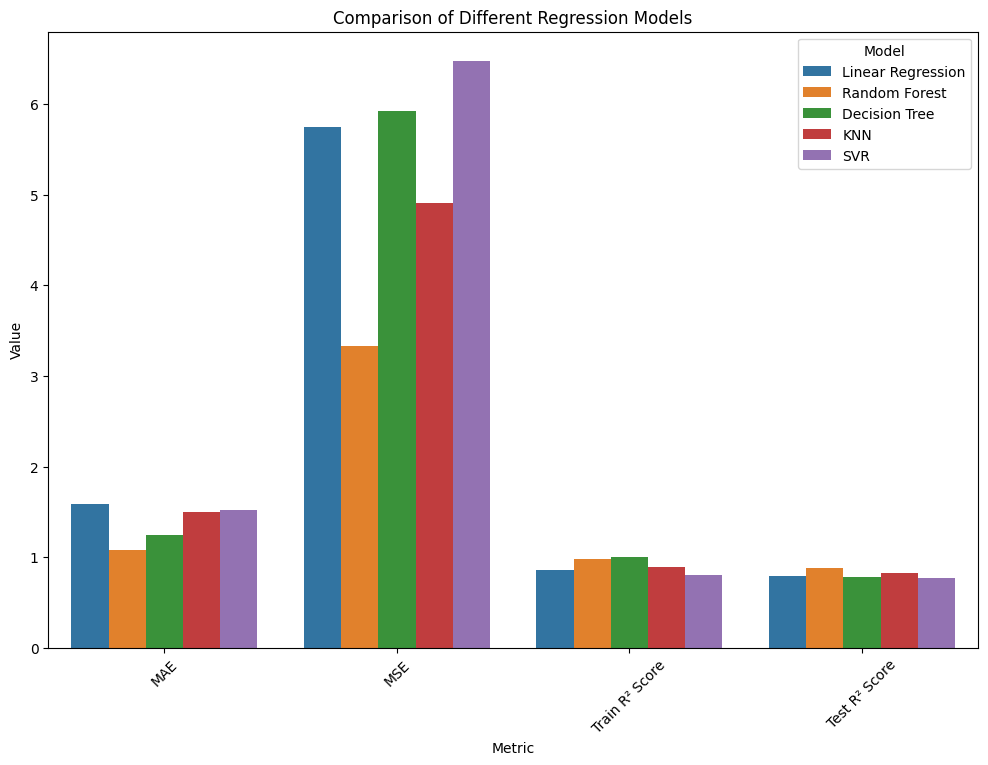

In [32]:
# Melting the DataFrame for easier plotting with seaborn
results_melted = pd.melt(results_df, id_vars='Model', var_name='Metric', value_name='Value')

# Plotting
plt.figure(figsize=(12, 8))
sns.barplot(data=results_melted, x='Metric', y='Value', hue='Model')
plt.title('Comparison of Different Regression Models')
plt.xlabel('Metric')
plt.ylabel('Value')
plt.xticks(rotation=45)
plt.legend(title='Model')
plt.show()

**Conclusion:**

- Random Forest stands out as the top performer due to its lowest errors (MAE, MSE) and high R² scores, indicating strong predictive power and generalization ability.

- KNN is the second-best option among the models listed, showing competitive performance with slightly higher errors compared to Random Forest but still maintaining respectable R² scores.

- Linear Regression is a the third, showing good performance across metrics but with slightly higher errors and lower R² scores compared to Random Forest and KNN.

In [33]:
# Defining X and y

X = df.iloc[:,:-1].values
y = df.iloc[:,-1].values

# Splitting the data into training and testing sets
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.2, random_state=0)

### RandomForest Regressor

In [34]:
# n_estimators is the number of trees you want to use for the model usually between 10 and 15.
regressor = RandomForestRegressor(n_estimators = 10, random_state = 0)
regressor.fit(X_train, y_train)

#We predict the test results

y_pred = regressor.predict(X_test)
np.set_printoptions(precision=2) # optional, this is to have decimal after the comma
#print(np.concatenate((y_pred.reshape(len(y_pred),1), y_test.reshape(len(y_test),1)),1))

r2_score(y_test, y_pred)

0.8483931537559095

### KNN

In [35]:
from sklearn.preprocessing import StandardScaler

# Feature scaling
scaler = StandardScaler()
X_train_scaled = scaler.fit_transform(X_train)
X_test_scaled = scaler.transform(X_test)

# Initializing the KNN regressor
knn_regressor = KNeighborsRegressor(n_neighbors=5)

# Training the KNN model
knn_regressor.fit(X_train_scaled, y_train)

r2_score(y_test, y_pred)

0.8483931537559095

### Linear Regression

In [36]:
# Initializing the regressor
regressor = LinearRegression()
regressor.fit(X_train, y_train)

#We predict the test results
y_pred = regressor.predict(X_test)

# what is the accuracy of this model if I try to make predictions? --> r^2 r-square

regressor.score(X_train,y_train)

0.8552292586897045

#### Cross Validation

In [37]:
from sklearn.model_selection import cross_val_score, KFold

# Standardizing the features
sc_X = StandardScaler()
X_scaled = sc_X.fit_transform(X)

# Initialize models
lr_model = LinearRegression()
rf_model = RandomForestRegressor(n_estimators=100, random_state=0)
knn_model = KNeighborsRegressor(n_neighbors=5)  # Example: Use appropriate number of neighbors

# Defining the number of folds
kfold = KFold(n_splits=10, shuffle=True, random_state=0)

# Performing cross-validation for Linear Regression
scores_lr = cross_val_score(lr_model, X_scaled, y, scoring='neg_mean_squared_error', cv=kfold)
rmse_scores_lr = np.sqrt(-scores_lr)

# Performing cross-validation for Random Forest
scores_rf = cross_val_score(rf_model, X_scaled, y, scoring='neg_mean_squared_error', cv=kfold)
rmse_scores_rf = np.sqrt(-scores_rf)

# Performing cross-validation for K-Nearest Neighbors
scores_knn = cross_val_score(knn_model, X_scaled, y, scoring='neg_mean_squared_error', cv=kfold)
rmse_scores_knn = np.sqrt(-scores_knn)

# Printing Linear Regression results
print("Linear Regression RMSE scores:", rmse_scores_lr)
print("Mean RMSE (LR):", rmse_scores_lr.mean())
print("Standard Deviation of RMSE (LR):", rmse_scores_lr.std())

# Printing Random Forest results
print("\nRandom Forest RMSE scores:", rmse_scores_rf)
print("Mean RMSE (RF):", rmse_scores_rf.mean())
print("Standard Deviation of RMSE (RF):", rmse_scores_rf.std())

# Printing K-Nearest Neighbors results
print("\nK-Nearest Neighbors RMSE scores:", rmse_scores_knn)
print("Mean RMSE (KNN):", rmse_scores_knn.mean())
print("Standard Deviation of RMSE (KNN):", rmse_scores_knn.std())

Linear Regression RMSE scores: [2.13 2.6  2.38 1.43 1.76 2.1  1.72 1.96 1.72 1.77]
Mean RMSE (LR): 1.9580895756231738
Standard Deviation of RMSE (LR): 0.3336761727257581

Random Forest RMSE scores: [1.88 1.85 2.03 1.15 1.53 1.36 1.65 1.7  0.91 1.42]
Mean RMSE (RF): 1.5477817691651985
Standard Deviation of RMSE (RF): 0.32942618941216134

K-Nearest Neighbors RMSE scores: [3.76 4.15 3.54 2.92 2.59 3.24 2.43 3.19 2.81 3.5 ]
Mean RMSE (KNN): 3.213621924811399
Standard Deviation of RMSE (KNN): 0.5119878516809894


**Conclusion:**

- Random Forest (RF) stands out as the top performer based on the lowest mean RMSE and moderate standard deviation. This indicates that RF captures the variance in the data well and generalizes effectively.

- Linear Regression (LR) follows RF with slightly higher mean RMSE but lower variability, making it a close second in performance.

- KNearest Neighbors (KNN) shows higher mean RMSE and more variability, indicating it might not be the optimal choice compared to LR and RF in this context.

#### Predictions

In [38]:
import random

# Splitting data into X and y
X = df.drop(columns=['G3'])
y = df['G3']

# Splitting data into training and testing sets
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.20, random_state=0)

# Feature scaling
scaler = StandardScaler()
X_train_scaled = scaler.fit_transform(X_train)
X_test_scaled = scaler.transform(X_test)

# Initializing and train the Linear Regression model
lr_model = LinearRegression()
lr_model.fit(X_train_scaled, y_train)

# Initializing and train the Random Forest model
rf_model = RandomForestRegressor(random_state=0)
rf_model.fit(X_train_scaled, y_train)

# Function to generate random input values within feature ranges (as integers)
def generate_random_input():
    random_values = {}
    for column in X.columns:
        min_val = int(X[column].min())
        max_val = int(X[column].max())
        random_values[column] = random.randint(min_val, max_val)
    return pd.DataFrame([random_values])

# Generating a sample of 10 sets of random input values
sample_inputs = [generate_random_input() for _ in range(10)]
sample_inputs_concat = pd.concat(sample_inputs, ignore_index=True)

# Scaling the sample inputs
sample_inputs_scaled = scaler.transform(sample_inputs_concat)

# Predicting the final grades (G3) using the trained models
lr_predicted_grades = lr_model.predict(sample_inputs_scaled)
rf_predicted_grades = rf_model.predict(sample_inputs_scaled)

# Cliping predicted grades to ensure they are within [0, 20] range and convert to integers
lr_predicted_grades = [int(min(max(0, grade), 20)) for grade in lr_predicted_grades]
rf_predicted_grades = [int(min(max(0, grade), 20)) for grade in rf_predicted_grades]

# Creating a DataFrame to store the inputs and predicted grades
data = sample_inputs_concat.copy()
data['LR_predicted_G3'] = lr_predicted_grades
data['RF_predicted_G3'] = rf_predicted_grades

# Printing random predictions
print("Random predictions:")
for i, res in data.iterrows():
    print(f"Sample {i+1} ==> Features: {res.to_dict()}"
          f"\nLR Predicted G3: {lr_predicted_grades[i]}, RF Predicted G3: {rf_predicted_grades[i]}\n")



Random predictions:
Sample 1 ==> Features: {'age': 20, 'Medu': 0, 'Fedu': 3, 'traveltime': 3, 'studytime': 2, 'failures': 2, 'famrel': 1, 'freetime': 1, 'goout': 4, 'Dalc': 3, 'Walc': 3, 'health': 3, 'absences': 51, 'school_enc': 0, 'sex_enc': 1, 'address_enc': 0, 'famsize_enc': 0, 'Pstatus_enc': 1, 'Mjob_enc': 3, 'Fjob_enc': 3, 'reason_enc': 1, 'guardian_enc': 0, 'schoolsup_enc': 0, 'famsup_enc': 1, 'paid_enc': 0, 'activities_enc': 1, 'nursery_enc': 0, 'higher_enc': 0, 'internet_enc': 0, 'romantic_enc': 0, 'G1': 18, 'G2': 5, 'LR_predicted_G3': 6, 'RF_predicted_G3': 6}
LR Predicted G3: 6, RF Predicted G3: 6

Sample 2 ==> Features: {'age': 16, 'Medu': 3, 'Fedu': 4, 'traveltime': 2, 'studytime': 2, 'failures': 1, 'famrel': 3, 'freetime': 1, 'goout': 3, 'Dalc': 3, 'Walc': 5, 'health': 4, 'absences': 29, 'school_enc': 0, 'sex_enc': 0, 'address_enc': 1, 'famsize_enc': 1, 'Pstatus_enc': 1, 'Mjob_enc': 0, 'Fjob_enc': 2, 'reason_enc': 1, 'guardian_enc': 1, 'schoolsup_enc': 0, 'famsup_enc': 1, 

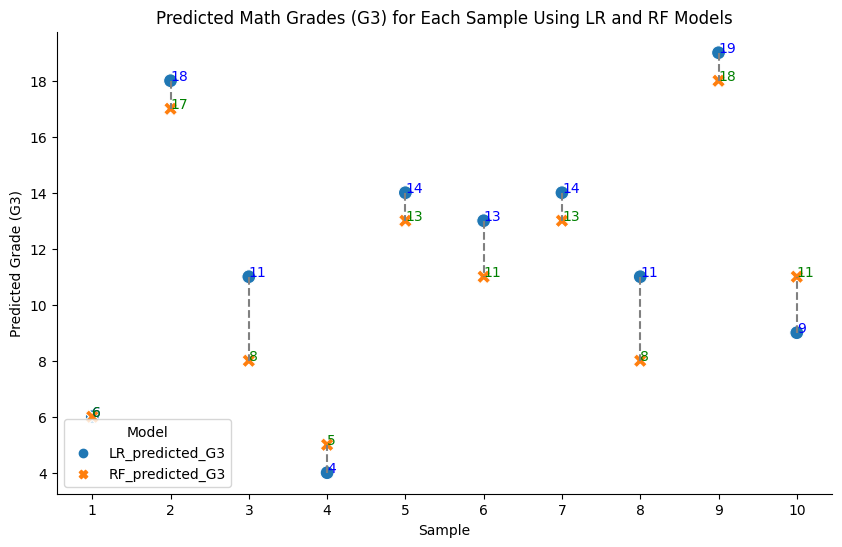

In [39]:
# Creating a long-form DataFrame for Plotting
long_data = pd.melt(data.reset_index(), id_vars='index', value_vars=['LR_predicted_G3', 'RF_predicted_G3'], 
                    var_name='model', value_name='predicted_G3')

# Adjusting index for 1-based sample numbering
long_data['index'] += 1

# Plotting the points for predicted G3 grades using seaborn
plt.figure(figsize=(10, 6))
sns.scatterplot(data=long_data, x='index', y='predicted_G3', hue='model', style='model', palette='tab10', s=100)

# Drawing lines connecting predicted G3 grades for each model
for i in range(1, len(data) + 1):
    plt.plot([i, i], [data.loc[i-1, 'LR_predicted_G3'], data.loc[i-1, 'RF_predicted_G3']], color='gray', linestyle='--')
    # Annotating the points with their integer values
    plt.text(i, data.loc[i-1, 'LR_predicted_G3'], f"{int(data.loc[i-1, 'LR_predicted_G3'])}", 
             horizontalalignment='left', size='medium', color='blue')
    plt.text(i, data.loc[i-1, 'RF_predicted_G3'], f"{int(data.loc[i-1, 'RF_predicted_G3'])}", 
             horizontalalignment='left', size='medium', color='green')

# Customising plot 
plt.title('Predicted Math Grades (G3) for Each Sample Using LR and RF Models')
plt.xlabel('Sample')
plt.ylabel('Predicted Grade (G3)')
plt.legend(title='Model')
plt.grid(False)
sns.despine()
plt.xticks(range(1, len(data) + 1))
plt.show()

In [40]:
# Selecting random samples from df
random_samples = df.sample(n=10, random_state=42)

# Retrieving initial index from df before resetting index
initial_indices = random_samples.index.tolist()

# Separating features and target
X_sample = random_samples.drop(columns=['G3'])
y_sample_actual = random_samples['G3']

# Scaling the features
X_sample_scaled = scaler.transform(X_sample)

# Predicting using Linear Regression and Random Forest
y_sample_pred_lr = lr_model.predict(X_sample_scaled)
y_sample_pred_rf = rf_model.predict(X_sample_scaled)

# Clipping and converting predictions to integers if necessary
y_sample_pred_lr = [int(min(max(0, grade), 20)) for grade in y_sample_pred_lr]
y_sample_pred_rf = [int(min(max(0, grade), 20)) for grade in y_sample_pred_rf]

# Creating a DataFrame to display actual vs predicted
comparison_df = pd.DataFrame({
    'Actual Grade': y_sample_actual,
    'LR Predicted Grade': y_sample_pred_lr,
    'RF Predicted Grade': y_sample_pred_rf
})

# Displaying the results
print("Comparison of Actual and Predicted Grades:")
comparison_df

Comparison of Actual and Predicted Grades:


,Actual Grade,LR Predicted Grade,RF Predicted Grade
78,10,6,7
371,12,11,11
248,5,3,5
55,10,8,9
390,9,9,8
223,13,11,12
42,18,18,18
234,6,7,6
316,0,6,2
116,14,12,13


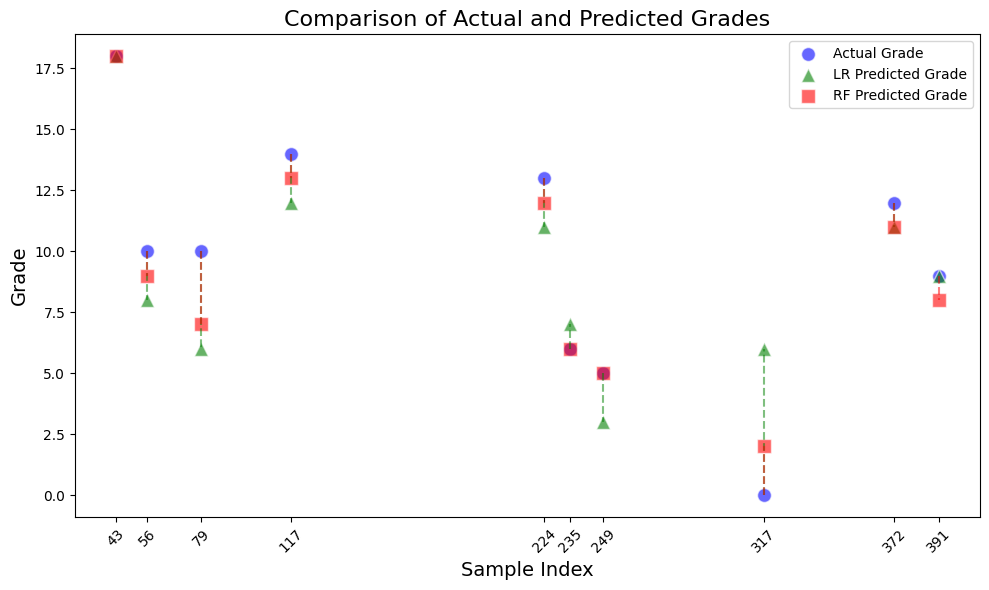

In [41]:
# Plotting the comparison data
plt.figure(figsize=(10, 6))

# Plotting Actual Grades
plt.scatter(comparison_df.index, comparison_df['Actual Grade'], color='blue', label='Actual Grade', alpha=0.6, edgecolors='w', s=100)

# Plotting LR Predicted Grades
plt.scatter(comparison_df.index, comparison_df['LR Predicted Grade'], color='green', label='LR Predicted Grade', marker='^', alpha=0.6, edgecolors='w', s=100)

# Plotting RF Predicted Grades
plt.scatter(comparison_df.index, comparison_df['RF Predicted Grade'], color='red', label='RF Predicted Grade', marker='s', alpha=0.6, edgecolors='w', s=100)

# Drawing dashed lines between actual and predicted grades for each sample
for i in comparison_df.index:
    plt.plot([i, i], [comparison_df.at[i, 'Actual Grade'], comparison_df.at[i, 'LR Predicted Grade']], 'g--', alpha=0.5)
    plt.plot([i, i], [comparison_df.at[i, 'Actual Grade'], comparison_df.at[i, 'RF Predicted Grade']], 'r--', alpha=0.5)

# Adding title and labels
plt.title('Comparison of Actual and Predicted Grades', fontsize=16)
plt.xlabel('Sample Index', fontsize=14)
plt.ylabel('Grade', fontsize=14)
plt.xticks(comparison_df.index, labels=[f"{idx+1}" for idx in comparison_df.index], rotation=45)
plt.legend()

# Show plot
plt.tight_layout()
plt.show()

## PT grades

In [42]:
# Importing the dataset
df_pt = pd.read_csv('/Users/diogomonteiro/Documents/Education/CCT/Summer BootCamp/Diploma in Predictive Analytics/CA/Question 2/student+performance/student-por.csv', delimiter=';', quotechar='"')
df_pt.head()

,school,sex,age,address,famsize,Pstatus,Medu,Fedu,Mjob,Fjob,reason,guardian,traveltime,studytime,failures,schoolsup,famsup,paid,activities,nursery,higher,internet,romantic,famrel,freetime,goout,Dalc,Walc,health,absences,G1,G2,G3
0,GP,F,18,U,GT3,A,4,4,at_home,teacher,course,mother,2,2,0,yes,no,no,no,yes,yes,no,no,4,3,4,1,1,3,4,0,11,11
1,GP,F,17,U,GT3,T,1,1,at_home,other,course,father,1,2,0,no,yes,no,no,no,yes,yes,no,5,3,3,1,1,3,2,9,11,11
2,GP,F,15,U,LE3,T,1,1,at_home,other,other,mother,1,2,0,yes,no,no,no,yes,yes,yes,no,4,3,2,2,3,3,6,12,13,12
3,GP,F,15,U,GT3,T,4,2,health,services,home,mother,1,3,0,no,yes,no,yes,yes,yes,yes,yes,3,2,2,1,1,5,0,14,14,14
4,GP,F,16,U,GT3,T,3,3,other,other,home,father,1,2,0,no,yes,no,no,yes,yes,no,no,4,3,2,1,2,5,0,11,13,13


In [43]:
df_pt.shape

(649, 33)

In [44]:
df_pt.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 649 entries, 0 to 648
Data columns (total 33 columns):
 #   Column      Non-Null Count  Dtype 
---  ------      --------------  ----- 
 0   school      649 non-null    object
 1   sex         649 non-null    object
 2   age         649 non-null    int64 
 3   address     649 non-null    object
 4   famsize     649 non-null    object
 5   Pstatus     649 non-null    object
 6   Medu        649 non-null    int64 
 7   Fedu        649 non-null    int64 
 8   Mjob        649 non-null    object
 9   Fjob        649 non-null    object
 10  reason      649 non-null    object
 11  guardian    649 non-null    object
 12  traveltime  649 non-null    int64 
 13  studytime   649 non-null    int64 
 14  failures    649 non-null    int64 
 15  schoolsup   649 non-null    object
 16  famsup      649 non-null    object
 17  paid        649 non-null    object
 18  activities  649 non-null    object
 19  nursery     649 non-null    object
 20  higher    

In [45]:
df_pt.describe().T

,count,mean,std,min,25%,50%,75%,max
age,649.0,16.744222,1.218138,15.0,16.0,17.0,18.0,22.0
Medu,649.0,2.514638,1.134552,0.0,2.0,2.0,4.0,4.0
Fedu,649.0,2.306626,1.099931,0.0,1.0,2.0,3.0,4.0
traveltime,649.0,1.568567,0.748660,1.0,1.0,1.0,2.0,4.0
studytime,649.0,1.930663,0.829510,1.0,1.0,2.0,2.0,4.0
failures,649.0,0.221880,0.593235,0.0,0.0,0.0,0.0,3.0
famrel,649.0,3.930663,0.955717,1.0,4.0,4.0,5.0,5.0
freetime,649.0,3.180277,1.051093,1.0,3.0,3.0,4.0,5.0
goout,649.0,3.184900,1.175766,1.0,2.0,3.0,4.0,5.0
Dalc,649.0,1.502311,0.924834,1.0,1.0,1.0,2.0,5.0


In [46]:
df_pt.isnull().sum()

school        0
sex           0
age           0
address       0
famsize       0
Pstatus       0
Medu          0
Fedu          0
Mjob          0
Fjob          0
reason        0
guardian      0
traveltime    0
studytime     0
failures      0
schoolsup     0
famsup        0
paid          0
activities    0
nursery       0
higher        0
internet      0
romantic      0
famrel        0
freetime      0
goout         0
Dalc          0
Walc          0
health        0
absences      0
G1            0
G2            0
G3            0
dtype: int64

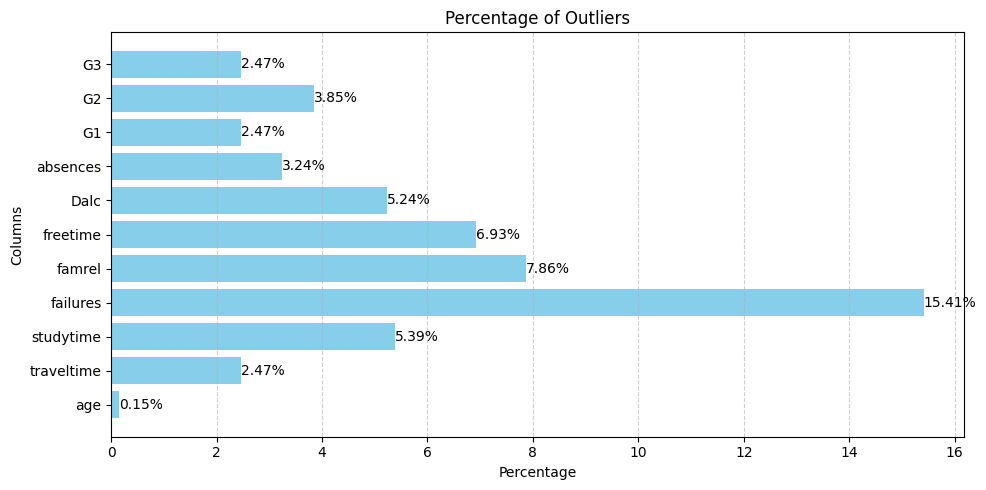

In [47]:
def calculate_percentage_of_outliers(df_pt, column_name, criterion='tukey'):
    # Calculating Interquartile Range
    Q1 = df_pt[column_name].quantile(0.25)
    Q3 = df_pt[column_name].quantile(0.75)
    IQR = Q3 - Q1

    if criterion == 'tukey':
        # Identifying outliers
        outliers = ((df_pt[column_name] < (Q1 - 1.5 * IQR)) | (df_pt[column_name] > (Q3 + 1.5 * IQR)))
    else:
        raise ValueError("Unsupported criterion. Use 'tukey'.")

    # Calculating the percentage of outliers
    percentage_of_outliers = round((outliers.sum() / len(df_pt)) * 100, 2)

    return percentage_of_outliers

# Iterating over numerical columns
numerical_columns = df_pt.select_dtypes(include=[np.number]).columns

percentage_outliers_tukey = []
columns_with_outliers = []

for column in numerical_columns:
    percentage_tukey = calculate_percentage_of_outliers(df_pt, column)
    if percentage_tukey != 0:
        percentage_outliers_tukey.append(percentage_tukey)
        columns_with_outliers.append(column)

# Plotting the results for columns with percentages
plt.figure(figsize=(10, 5))

bars_tukey = plt.barh(np.arange(len(columns_with_outliers)), percentage_outliers_tukey, color='skyblue', label="Tukey's Criterion")

# Adding percentage values to the bars
for i, bar in enumerate(bars_tukey):
    plt.text(bar.get_width(), bar.get_y() + bar.get_height()/2, f'{bar.get_width()}%', ha='left', va='center', color='black')

plt.yticks(np.arange(len(columns_with_outliers)), columns_with_outliers)
plt.xlabel('Percentage')
plt.ylabel('Columns')
plt.title('Percentage of Outliers')
plt.grid(axis='x', linestyle='--', alpha=0.6)
plt.tight_layout()
plt.show()


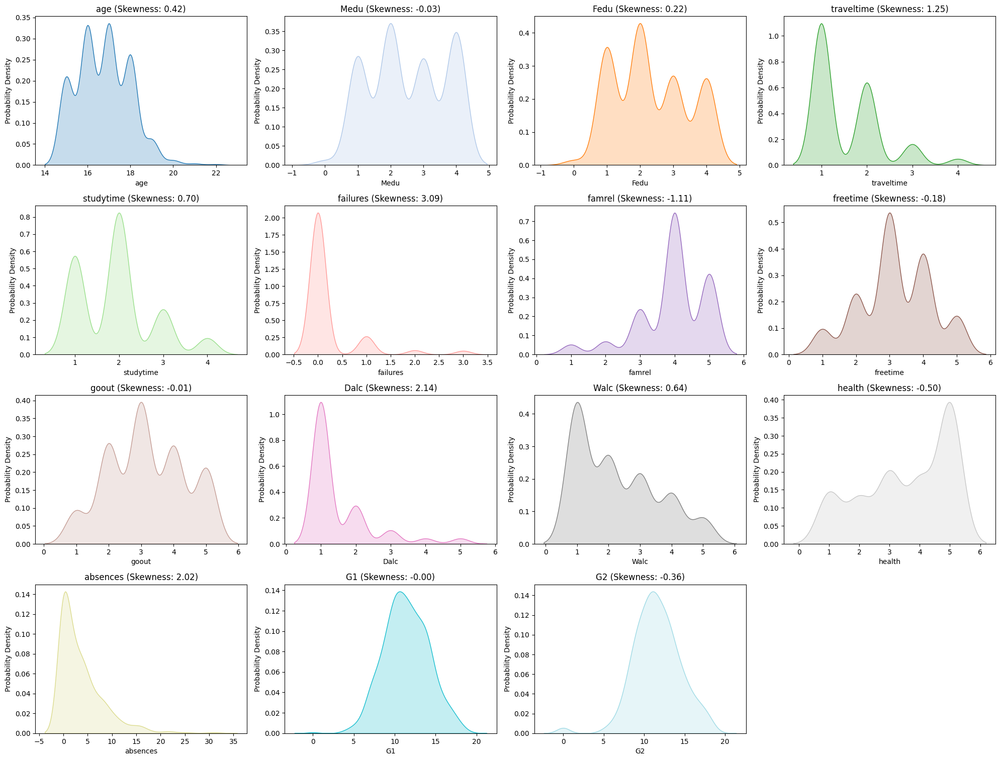

In [48]:
numerical_columns = df_pt.select_dtypes(include=['number'])

# Generating a list of colors using a colormap
cmap = plt.cm.get_cmap('tab20', 15)
colors = [cmap(i) for i in range(15)]

# Calculating skewness for each column
skewness = df_pt[numerical_columns.columns].skew()

# Plotting the KDE distribution for each column
plt.figure(figsize=(20, 60))
for i, (column, color) in enumerate(zip(numerical_columns.columns, colors), 1):
    plt.subplot(16, 4, i)
    sns.kdeplot(data=df_pt, x=column, shade=True, color=color, label=f'{column}')
    plt.xlabel(column)
    plt.ylabel('Probability Density')
    plt.title(f'{column} (Skewness: {skewness[column]:.2f})')

plt.tight_layout()
plt.show()

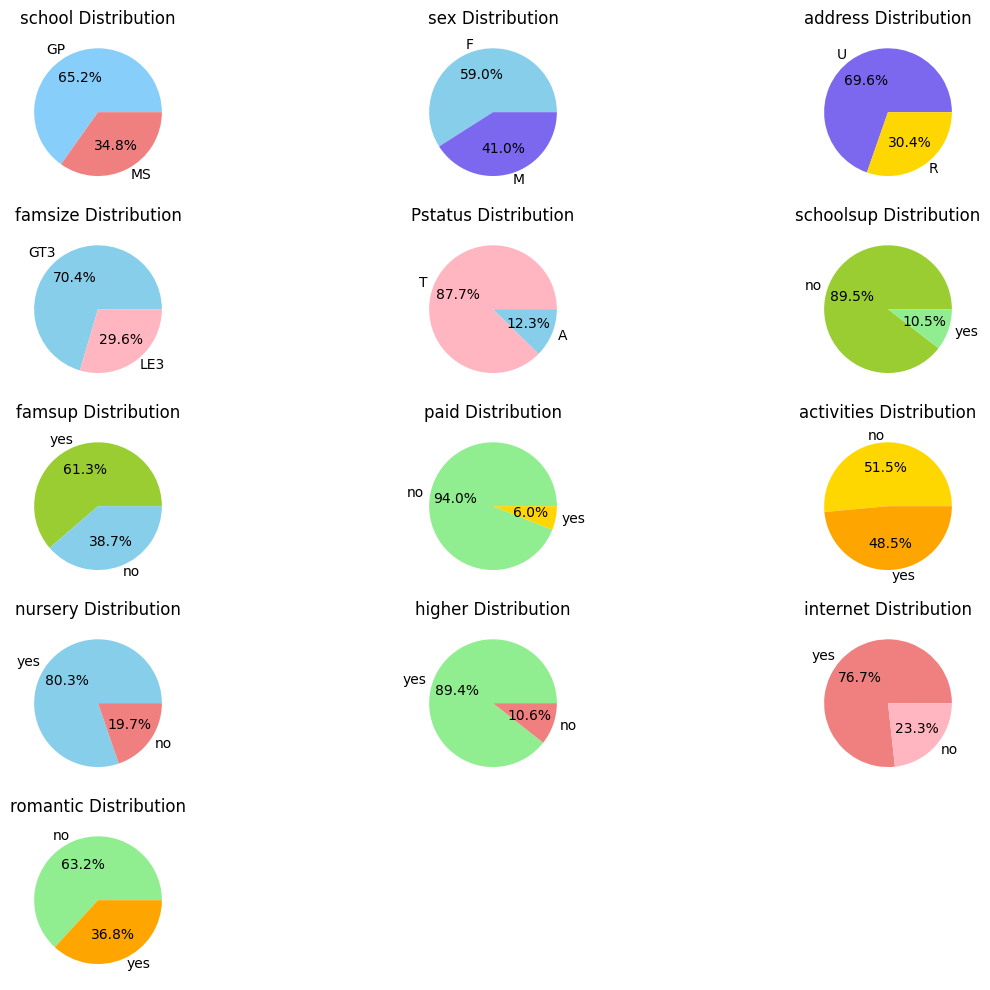

In [49]:
import random

# Identifying features with exactly 2 unique values
binary_features = []
for column in df_pt.columns:
    if df_pt[column].nunique() == 2:
        binary_features.append(column)

# Defining colors
colors = ['skyblue', 'lightcoral', 'lightgreen', 'orange', 'gold', 'mediumslateblue', 'lightpink', 'yellowgreen', 'lightskyblue']

# Shuffling colors to randomise selection
random.shuffle(colors)

# Plotting features in pie charts with different colors
num_plots = len(binary_features)
num_rows = (num_plots + 2) // 3  # 3 plots per row

plt.figure(figsize=(12, 2 * num_rows))

# List to store used color pairs
used_color_pairs = []

for i, feature in enumerate(binary_features, 1):
    plt.subplot(num_rows, 3, i)
    feature_counts = df_pt[feature].value_counts()
    
    # Selecting two unique colors that haven't been used together before
    while True:
        selected_colors = random.sample(colors, 2)
        if tuple(selected_colors) not in used_color_pairs:
            used_color_pairs.append(tuple(selected_colors))
            break
    
    plt.pie(feature_counts, labels=feature_counts.index, autopct='%1.1f%%', colors=selected_colors)
    plt.title(f'{feature} Distribution')

plt.tight_layout()
plt.show()

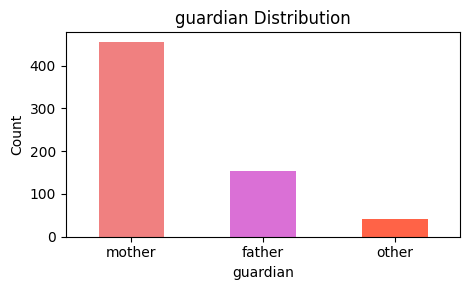

In [50]:
# Identifying features with exactly 2 unique values
binary_features = []
for column in df_pt.columns:
    if df_pt[column].nunique() == 3:
        binary_features.append(column)

# Defining colors for bar plots
colors = ['orchid', 'lightcoral', 'deepskyblue', 'limegreen', 'gold', 'mediumslateblue', 'tomato']

# Shuffling colors to randomize selection
random.shuffle(colors)

# Plotting features in bar plots with different colors
num_plots = len(binary_features)
num_rows = (num_plots + 2) // 3

plt.figure(figsize=(13, 3 * num_rows))

# List to store used color pairs
used_color_pairs = []

for i, feature in enumerate(binary_features, 1):
    plt.subplot(num_rows, 3, i)
    feature_counts = df_pt[feature].value_counts()
    
    # Selecting unique colors that haven't been used together before
    while True:
        selected_colors = random.sample(colors, 3)
        if tuple(selected_colors) not in used_color_pairs:
            used_color_pairs.append(tuple(selected_colors))
            break
    
    feature_counts.plot(kind='bar', color=selected_colors)
    plt.xticks(rotation=0)
    plt.xlabel(feature)
    plt.ylabel('Count')
    plt.title(f'{feature} Distribution')

plt.tight_layout()
plt.show()

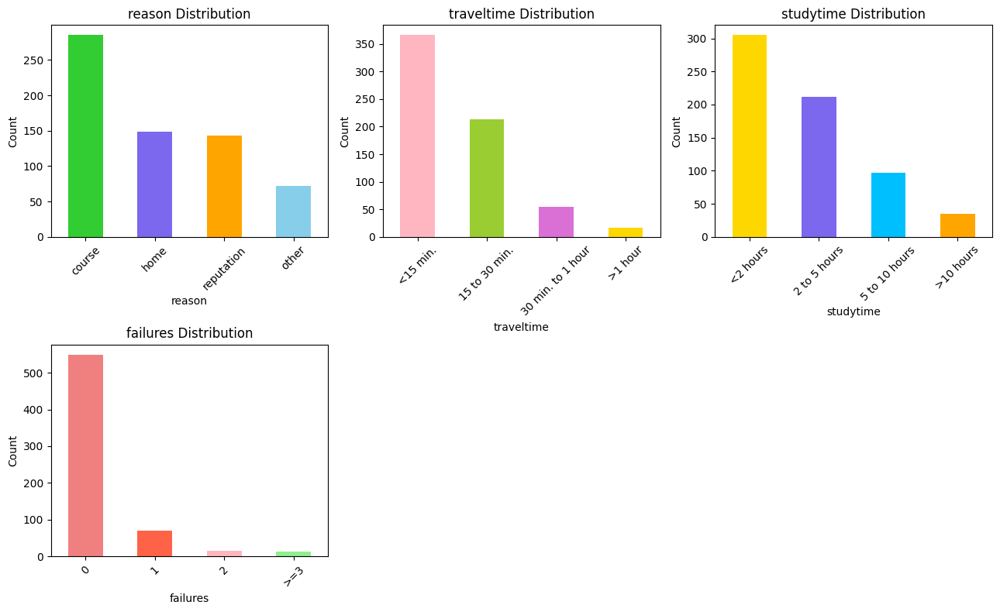

In [51]:
# Identifying features with exactly 2 unique values
binary_features = []
for column in df_pt.columns:
    if df_pt[column].nunique() == 4:
        binary_features.append(column)

# Defining colors for bar plots
colors = [
    'skyblue', 'lightcoral', 'lightgreen', 'orange', 'gold', 'mediumslateblue', 'lightpink', 'yellowgreen', 'lightskyblue',
    'orchid', 'lightcoral', 'deepskyblue', 'limegreen', 'gold', 'mediumslateblue', 'tomato'
]

# Shuffling colors to randomize selection
random.shuffle(colors)

# Correcting order for plotting
feature_order = {
    'traveltime': ['<15 min.', '15 to 30 min.', '30 min. to 1 hour', '>1 hour'],
    'studytime': ['<2 hours', '2 to 5 hours', '5 to 10 hours', '>10 hours'],
    'failures': ['0', '1', '2', '>=3']
}

# Plotting features in bar plots with different colors
num_plots = len(binary_features)
num_rows = (num_plots + 2) // 3

plt.figure(figsize=(13, 4 * num_rows))

# List to store used color pairs
used_color_pairs = []

for i, feature in enumerate(binary_features, 1):
    plt.subplot(num_rows, 3, i)
    feature_counts = df_pt[feature].value_counts()
    
    # Selecting colors based on order and shuffle
    selected_colors = random.sample(colors, 4)
    
    # Plotting the bar chart
    feature_counts.plot(kind='bar', color=selected_colors)
    
    # Set x-axis ticks and labels in the correct order
    if feature in feature_order:
        plt.xticks(range(len(feature_order[feature])), feature_order[feature])
    
    plt.xlabel(feature)
    plt.ylabel('Count')
    plt.xticks(rotation=45)
    plt.title(f'{feature} Distribution')

plt.tight_layout()
plt.show()

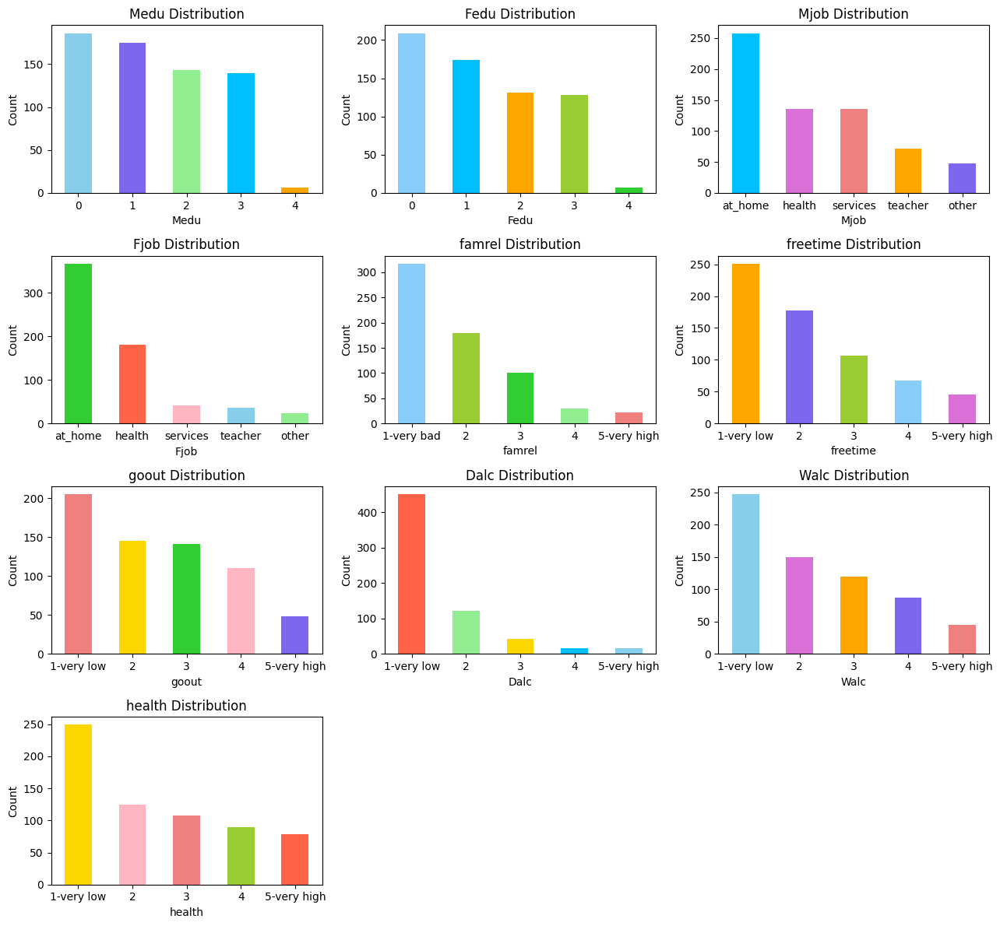

In [52]:
# Identifying features with exactly 5 unique values
features_with_5_values = []
for column in df_pt.columns:
    if df_pt[column].nunique() == 5:
        features_with_5_values.append(column)

# Defining colors for bar plots
colors = [
    'skyblue', 'lightcoral', 'lightgreen', 'orange', 'gold', 'mediumslateblue', 'lightpink', 'yellowgreen', 'lightskyblue',
    'orchid', 'lightcoral', 'deepskyblue', 'limegreen', 'gold', 'mediumslateblue', 'tomato'
]

# Shuffling colors to randomize selection
random.shuffle(colors)

# Correcting order for plotting
feature_order = {
    'famsize': ['LE3', 'GT3'],
    'Pstatus': ['T', 'A'],
    'Medu': [0, 1, 2, 3, 4],
    'Fedu': [0, 1, 2, 3, 4],
    'Mjob': ['at_home', 'health', 'services', 'teacher', 'other'],
    'Fjob': ['at_home', 'health', 'services', 'teacher', 'other'],
    'famrel': ["1-very bad", 2, 3, 4, '5-very high'],
    'freetime': ['1-very low', 2, 3, 4, '5-very high'],
    'goout': ['1-very low', 2, 3, 4, '5-very high'],
    'Dalc': ['1-very low', 2, 3, 4, '5-very high'],
    'Walc': ['1-very low', 2, 3, 4, '5-very high'],
    'health': ['1-very low', 2, 3, 4, '5-very high']
}

# Plotting features in bar plots with different colors
num_plots = len(features_with_5_values)
num_rows = (num_plots + 2) // 3

plt.figure(figsize=(13, 3 * num_rows))

# List to store used color sets
used_color_sets = []

for i, feature in enumerate(features_with_5_values, 1):
    plt.subplot(num_rows, 3, i)
    feature_counts = df_pt[feature].value_counts()
    
    # Selecting colors based on order and shuffle
    selected_colors = random.sample(colors, 5)
    
    # Plotting the bar chart
    feature_counts.plot(kind='bar', color=selected_colors)
    
    # Set x-axis ticks and labels in the correct order
    if feature in feature_order:
        plt.xticks(range(len(feature_order[feature])), feature_order[feature])
    
    plt.xlabel(feature)
    plt.ylabel('Count')
    plt.xticks(rotation=0)
    plt.title(f'{feature} Distribution')

plt.tight_layout()
plt.show()

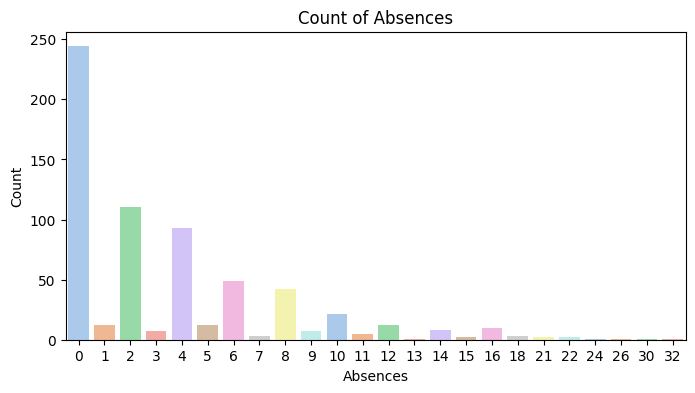

In [53]:
# Plotting the count of absences
plt.figure(figsize=(8, 4))
sns.countplot(data=df_pt, x='absences', palette='pastel')
plt.xlabel('Absences')
plt.ylabel('Count')
plt.title('Count of Absences')
plt.show()

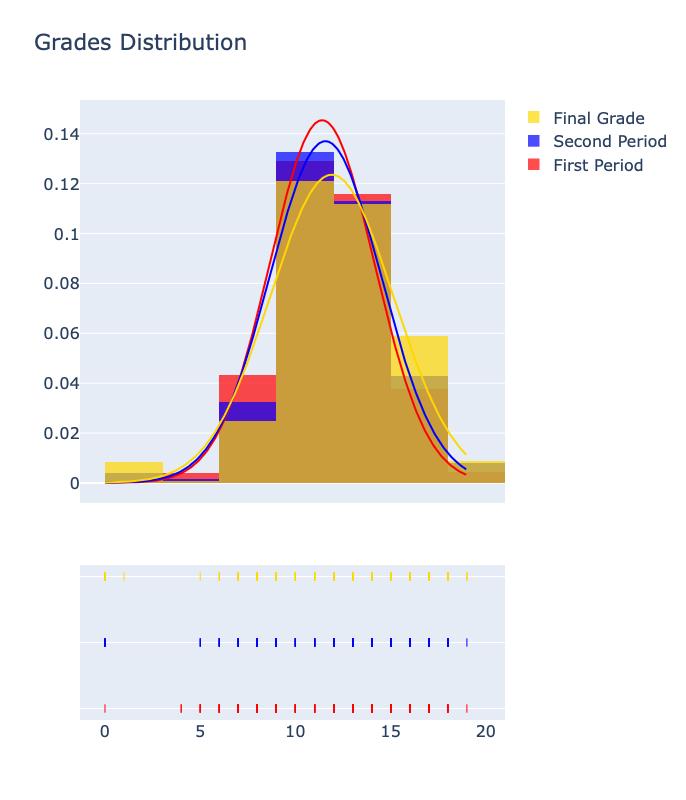

In [54]:
import chart_studio.plotly as py
import plotly.figure_factory as ff
from plotly.offline import download_plotlyjs, init_notebook_mode, iplot
from plotly.graph_objs import *
init_notebook_mode()

# Adding histogram data
x1 = df_pt['G1'].values.tolist() 
x2 = df_pt['G2'].values.tolist()  
x3 = df_pt['G3'].values.tolist()    

# Grouping data together
hist_data = [x1, x2, x3]
group_labels = ['First Period', 'Second Period', 'Final Grade']
colors = ["red", "blue", "gold"]

# Creating distplot with custom bin_size
fig = ff.create_distplot(hist_data, group_labels, bin_size=3, curve_type='normal', colors=colors)
fig['layout'].update(
    title='Grades Distribution',
    font=dict(size=16),
    width=1100,
    height=800
)

iplot(fig)


In [55]:
df_2 = df_pt.copy()

# Mapping dictionary according to requirements
mapping = {
    'school': {'GP': 0, 'MS': 1},
    'sex': {'F': 0, 'M': 1},
    'address': {'U': 0, 'R': 1},
    'famsize': {'LE3': 0, 'GT3': 1},
    'Pstatus': {'T': 0, 'A': 1},
    'Mjob': {'at_home': 0, 'teacher': 1, 'health': 2, 'services': 3, 'other': 4},
    'Fjob': {'teacher': 0, 'health': 1, 'services': 2, 'at_home': 3, 'other': 4},
    'reason': {'home': 0, 'reputation': 1, 'course': 2, 'other': 3},
    'guardian': {'mother': 0, 'father': 1, 'other': 2},
    'schoolsup': {'no': 0, 'yes': 1},
    'famsup': {'no': 0, 'yes': 1},
    'paid': {'no': 0, 'yes': 1},
    'activities': {'no': 0, 'yes': 1},
    'nursery': {'no': 0, 'yes': 1},
    'higher': {'no': 0, 'yes': 1},
    'internet': {'no': 0, 'yes': 1},
    'romantic': {'no': 0, 'yes': 1}
}

# Applying mapping to each column
for col, map_dict in mapping.items():
    df_2[col+'_enc'] = df_2[col].map(map_dict)

# Droping original categorical columns
df_2.drop(list(mapping.keys()), axis=1, inplace=True)

# Displaying
df_2.head()

,age,Medu,Fedu,traveltime,studytime,failures,famrel,freetime,goout,Dalc,Walc,health,absences,G1,G2,G3,school_enc,sex_enc,address_enc,famsize_enc,Pstatus_enc,Mjob_enc,Fjob_enc,reason_enc,guardian_enc,schoolsup_enc,famsup_enc,paid_enc,activities_enc,nursery_enc,higher_enc,internet_enc,romantic_enc
0,18,4,4,2,2,0,4,3,4,1,1,3,4,0,11,11,0,0,0,1,1,0,0,2,0,1,0,0,0,1,1,0,0
1,17,1,1,1,2,0,5,3,3,1,1,3,2,9,11,11,0,0,0,1,0,0,4,2,1,0,1,0,0,0,1,1,0
2,15,1,1,1,2,0,4,3,2,2,3,3,6,12,13,12,0,0,0,0,0,0,4,3,0,1,0,0,0,1,1,1,0
3,15,4,2,1,3,0,3,2,2,1,1,5,0,14,14,14,0,0,0,1,0,2,2,0,0,0,1,0,1,1,1,1,1
4,16,3,3,1,2,0,4,3,2,1,2,5,0,11,13,13,0,0,0,1,0,4,4,0,1,0,1,0,0,1,1,0,0


In [56]:
from scipy import stats

# Droping 'G1' and 'G2', then selecting numerical columns
numerical_columns = df_2.drop(['G1', 'G2'], axis=1).select_dtypes(include='number').columns

# List to store features with correlation >= 0.2 and <=-0.2 and their direction
significant_features = []

# Looping through numerical columns and calculate correlation with 'G3'
for column in numerical_columns:
    if column != 'G3': 
        pearson_coef, p_value = stats.pearsonr(df_2[column], df_2['G3'])
        
        # Determining the direction (positive or negative)
        if pearson_coef > 0:
            correlation_direction = 'Positive'
        elif pearson_coef < 0:
            correlation_direction = 'Negative'
        else:
            correlation_direction = 'No correlation'
        
        # Printing analysis details
        print(f'Analysis between {column} and G3:')
        print(f'Pearson correlation coefficient: {pearson_coef:.2f}')
        print(f'Correlation Direction: {correlation_direction}')
        print(f'P-value: {p_value:.3f}')
        
        # Determining the strength of the correlation
        if abs(pearson_coef) >= 0.7:
            print('Correlation Coefficient: Large relationship')
        elif 0.4 <= abs(pearson_coef) < 0.7:
            print('Correlation Coefficient: Moderate relationship')
        elif 0.3 <= abs(pearson_coef) < 0.4:
            print('Correlation Coefficient: Weak relationship')
        else:
            print('Correlation Coefficient: No significant relationship')
        
        # Determining the certainty level based on the p-value
        if p_value < 0.001:
            print('P-value: Strong certainty in the result')
        elif p_value < 0.05:
            print('P-value: Moderate certainty in the result')
        elif p_value < 0.1:
            print('P-value: Weak certainty in the result')
        else:
            print('P-value: No certainty in the result')
        
        print('\n')
        
        # Checking if correlation coefficient meets threshold and add to list
        if abs(pearson_coef) >= 0.2:
            significant_features.append((column, correlation_direction))
        elif abs(pearson_coef) <= -0.2:
            significant_features.append((column, correlation_direction))



Analysis between age and G3:
Pearson correlation coefficient: -0.11
Correlation Direction: Negative
P-value: 0.007
Correlation Coefficient: No significant relationship
P-value: Moderate certainty in the result


Analysis between Medu and G3:
Pearson correlation coefficient: 0.24
Correlation Direction: Positive
P-value: 0.000
Correlation Coefficient: No significant relationship
P-value: Strong certainty in the result


Analysis between Fedu and G3:
Pearson correlation coefficient: 0.21
Correlation Direction: Positive
P-value: 0.000
Correlation Coefficient: No significant relationship
P-value: Strong certainty in the result


Analysis between traveltime and G3:
Pearson correlation coefficient: -0.13
Correlation Direction: Negative
P-value: 0.001
Correlation Coefficient: No significant relationship
P-value: Moderate certainty in the result


Analysis between studytime and G3:
Pearson correlation coefficient: 0.25
Correlation Direction: Positive
P-value: 0.000
Correlation Coefficient: No s

In [57]:
# Printing significant features
print(f'Features with correlation coefficient >= 0.2 ot <= -0.2 with G3: {significant_features}')


Features with correlation coefficient >= 0.2 ot <= -0.2 with G3: [('Medu', 'Positive'), ('Fedu', 'Positive'), ('studytime', 'Positive'), ('failures', 'Negative'), ('Dalc', 'Negative'), ('school_enc', 'Negative'), ('higher_enc', 'Positive')]


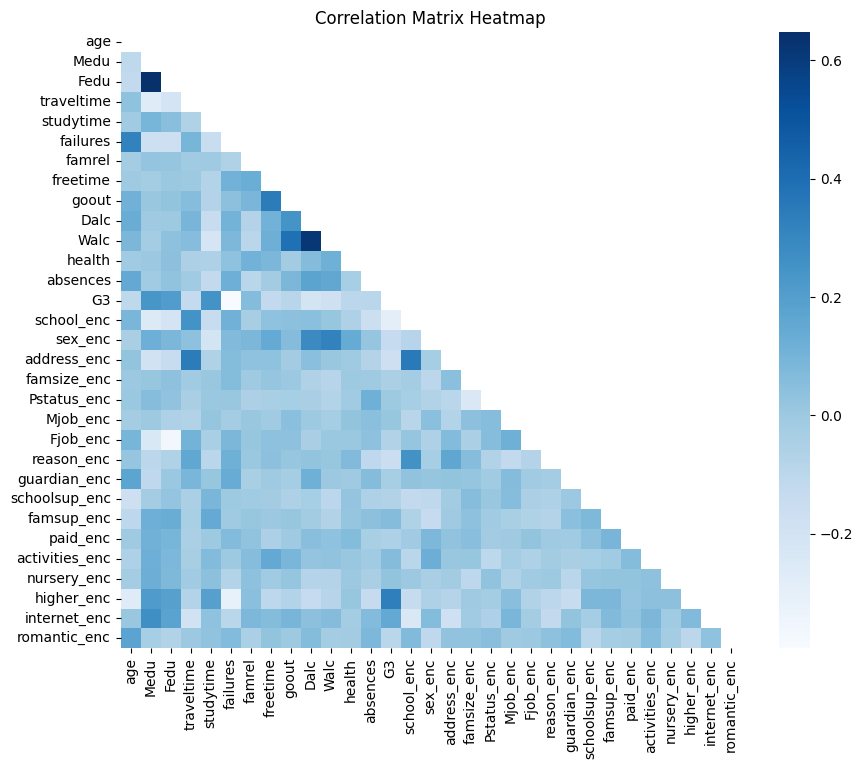

In [58]:
# Selecting numerical columns excluding 'G1' and 'G2'
numerical_columns = df_2.drop(['G1', 'G2'], axis=1)

# Calculating the correlation matrix
correlation_matrix = numerical_columns.corr()

plt.figure(figsize=(10, 8))
# Creating a mask to hide the upper triangle
mask = np.triu(np.ones_like(correlation_matrix, dtype=bool))

# Generating a heatmap with the mask
sns.heatmap(correlation_matrix, mask=mask, cmap='Blues', annot=True, fmt=".2f")

plt.title('Correlation Matrix Heatmap')
plt.show()

#### Attempting LR with best k features

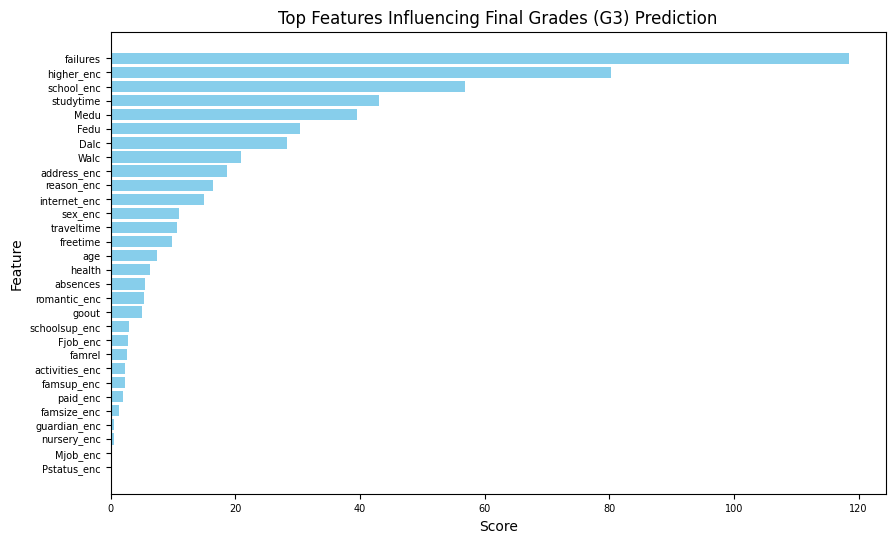

In [59]:
from sklearn.feature_selection import SelectKBest, chi2, f_regression

# Initializing SelectKBest
kbest = SelectKBest(score_func=f_regression, k='all') 

# Splitting data into X y
X = df_2.drop(['G3','G1', 'G2'], axis=1)  
y = df_2['G3']

# Fiting SelectKBest on features and target variable
kbest.fit(X, y)

# Geting the scores of each feature
scores = kbest.scores_

# Sorting the features based on scores
sorted_indices = np.argsort(scores)[::-1]  # Sort in descending order

# Plotting the top k features with scores
top_k = 30  # number of top features to plot
top_features = X.columns[sorted_indices[:top_k]]
top_scores = scores[sorted_indices[:top_k]]

plt.figure(figsize=(10, 6))
plt.barh(top_features, top_scores, color='skyblue')
plt.xlabel('Score')
plt.ylabel('Feature')
plt.xticks(fontsize = 7)
plt.yticks(fontsize = 7)
plt.title('Top Features Influencing Final Grades (G3) Prediction')
plt.gca().invert_yaxis()  # Invert y-axis to have the highest score at the top
plt.show()

In [60]:
top_features

Index(['failures', 'higher_enc', 'school_enc', 'studytime', 'Medu', 'Fedu',
       'Dalc', 'Walc', 'address_enc', 'reason_enc', 'internet_enc', 'sex_enc',
       'traveltime', 'freetime', 'age', 'health', 'absences', 'romantic_enc',
       'goout', 'schoolsup_enc', 'Fjob_enc', 'famrel', 'activities_enc',
       'famsup_enc', 'paid_enc', 'famsize_enc', 'guardian_enc', 'nursery_enc',
       'Mjob_enc', 'Pstatus_enc'],
      dtype='object')

In [61]:
top_features = [
    'failures', 'higher_enc', 'school_enc', 'studytime', 'Medu', 'Fedu',
    'Dalc', 'Walc', 'address_enc', 'reason_enc', 'internet_enc', 'sex_enc',
    'traveltime', 'freetime', 'age', 'health', 'absences', 'romantic_enc',
    'goout', 'schoolsup_enc', 'Fjob_enc', 'famrel', 'activities_enc',
    'famsup_enc', 'paid_enc', 'famsize_enc', 'guardian_enc', 'nursery_enc',
    'Mjob_enc', 'Pstatus_enc','G3']

# Checking which features are not present in the dataset if any
missing_features = [feature for feature in top_features if feature not in df_2.columns]
if missing_features:
    print(f"These features are missing from the dataset: {missing_features}")
else:
    print('No missing features')

# Filtering the dataset to include only the top features that are present
available_features = [feature for feature in top_features if feature in df_2.columns]
filtered_df = df[available_features]

filtered_df.head()

No missing features


,failures,higher_enc,school_enc,studytime,Medu,Fedu,Dalc,Walc,address_enc,reason_enc,internet_enc,sex_enc,traveltime,freetime,age,health,absences,romantic_enc,goout,schoolsup_enc,Fjob_enc,famrel,activities_enc,famsup_enc,paid_enc,famsize_enc,guardian_enc,nursery_enc,Mjob_enc,Pstatus_enc,G3
0,0,1,0,2,4,4,1,1,0,2,0,0,2,3,18,3,6,0,4,1,0,4,0,0,0,1,0,1,0,1,6
1,0,1,0,2,1,1,1,1,0,2,1,0,1,3,17,3,4,0,3,0,4,5,0,1,0,1,1,0,0,0,6
2,3,1,0,2,1,1,2,3,0,3,1,0,1,3,15,3,10,0,2,1,4,4,0,0,1,0,0,1,0,0,10
3,0,1,0,3,4,2,1,1,0,0,1,0,1,2,15,5,2,1,2,0,2,3,1,1,1,1,0,1,2,0,15
4,0,1,0,2,3,3,1,2,0,0,0,0,1,3,16,5,4,0,2,0,4,4,0,1,1,1,1,1,4,0,10


In [62]:
# Selecting X and y

X = df_2.iloc[:,:-1].values
y = df_2.iloc[:,-1].values

In [63]:
# Splitting the data into training and testing sets

from sklearn.model_selection import train_test_split
X_train, X_test, y_train, y_test = train_test_split(X,y,test_size = 0.20, random_state = 0)

In [64]:
# Defining the model --> Linear Regression

from sklearn.linear_model import LinearRegression
regressor = LinearRegression()
regressor.fit(X_train, y_train)

LinearRegression()

In [65]:
y_pred = regressor.predict(X_test)

In [66]:
# Accuracy of this model to try to make predictions? --> r^2 r-square

regressor.score(X_train,y_train)

0.12151837020887568

#### Attempting LR with all features

In [67]:
df_2.head(1)

,age,Medu,Fedu,traveltime,studytime,failures,famrel,freetime,goout,Dalc,Walc,health,absences,G1,G2,G3,school_enc,sex_enc,address_enc,famsize_enc,Pstatus_enc,Mjob_enc,Fjob_enc,reason_enc,guardian_enc,schoolsup_enc,famsup_enc,paid_enc,activities_enc,nursery_enc,higher_enc,internet_enc,romantic_enc
0,18,4,4,2,2,0,4,3,4,1,1,3,4,0,11,11,0,0,0,1,1,0,0,2,0,1,0,0,0,1,1,0,0


In [68]:
df_2.columns

Index(['age', 'Medu', 'Fedu', 'traveltime', 'studytime', 'failures', 'famrel',
       'freetime', 'goout', 'Dalc', 'Walc', 'health', 'absences', 'G1', 'G2',
       'G3', 'school_enc', 'sex_enc', 'address_enc', 'famsize_enc',
       'Pstatus_enc', 'Mjob_enc', 'Fjob_enc', 'reason_enc', 'guardian_enc',
       'schoolsup_enc', 'famsup_enc', 'paid_enc', 'activities_enc',
       'nursery_enc', 'higher_enc', 'internet_enc', 'romantic_enc'],
      dtype='object')

In [69]:
# Define the new order of column names
new_order = [
    'age', 'Medu', 'Fedu', 'traveltime', 'studytime', 'failures', 'famrel',
    'freetime', 'goout', 'Dalc', 'Walc', 'health', 'absences', 
    'school_enc', 'sex_enc', 'address_enc', 'famsize_enc',
    'Pstatus_enc', 'Mjob_enc', 'Fjob_enc', 'reason_enc', 'guardian_enc',
    'schoolsup_enc', 'famsup_enc', 'paid_enc', 'activities_enc',
    'nursery_enc', 'higher_enc', 'internet_enc', 'romantic_enc', 'G1', 'G2', 'G3'
]

# Reindexing the DataFrame with the new order of columns
df_2 = df_2.reindex(columns=new_order)
df_2.head(1)

,age,Medu,Fedu,traveltime,studytime,failures,famrel,freetime,goout,Dalc,Walc,health,absences,school_enc,sex_enc,address_enc,famsize_enc,Pstatus_enc,Mjob_enc,Fjob_enc,reason_enc,guardian_enc,schoolsup_enc,famsup_enc,paid_enc,activities_enc,nursery_enc,higher_enc,internet_enc,romantic_enc,G1,G2,G3
0,18,4,4,2,2,0,4,3,4,1,1,3,4,0,0,0,1,1,0,0,2,0,1,0,0,0,1,1,0,0,0,11,11


In [70]:
# Selecting X and y

X = df_2.iloc[:,:-1].values
y = df_2.iloc[:,-1].values

# Splitting the data into training and testing sets
X_train, X_test, y_train, y_test = train_test_split(X,y,test_size = 0.20, random_state = 0)

# Initialising the regressor
regressor = LinearRegression()
regressor.fit(X_train, y_train)

y_pred = regressor.predict(X_test)

regressor.score(X_train,y_train)

0.85524101923767

In [71]:
from sklearn.ensemble import RandomForestRegressor
from sklearn.tree import DecisionTreeRegressor
from sklearn.neighbors import KNeighborsRegressor
from sklearn.svm import SVR
from sklearn.metrics import mean_absolute_error, mean_squared_error, r2_score

# Selecting X and y
X = df_2.iloc[:,:-1].values
y = df_2.iloc[:,-1].values

# Splitting the data into training and testing sets
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.2, random_state=0)

# Initializing regressors
regressors = {
    'Linear Regression': LinearRegression(),
    'Random Forest': RandomForestRegressor(),
    'Decision Tree': DecisionTreeRegressor(),
    'KNN': KNeighborsRegressor(),
    'SVR': SVR()
}

# Training and evaluating regressors
results = {}
for name, reg in regressors.items():
    reg.fit(X_train, y_train)
    y_pred = reg.predict(X_test)
    
    mae = mean_absolute_error(y_test, y_pred)
    mse = mean_squared_error(y_test, y_pred)
    r2 = r2_score(y_test, y_pred)
    train_score = reg.score(X_train, y_train)  # Training R² score
    test_score = reg.score(X_test, y_test)  # Testing R² score
    
    results[name] = {
        'MAE': mae,
        'MSE': mse,
        'Train R² Score': train_score,
        'Test R² Score': test_score
    }

# Converting results to a DataFrame
results_df = pd.DataFrame(results).transpose()
results_df = results_df.reset_index().rename(columns={'index': 'Model'})
results_df

,Model,MAE,MSE,Train R² Score,Test R² Score
0,Linear Regression,0.763987,1.030087,0.855241,0.854997
1,Random Forest,0.775923,1.162804,0.976490,0.836315
2,Decision Tree,0.900000,1.792308,1.000000,0.747701
3,KNN,0.823077,1.105538,0.849713,0.844376
4,SVR,0.734106,1.005490,0.807270,0.858459


**Conclusion:**

- SVR has the lowest MAE, a very competitive MSE, and the highest Test R² Score among all models. This suggests it is very effective at both fitting and predicting unseen data, despite a slightly lower Train R² Score compared to others.
- Linear Regression: It shows a strong balance with both low MAE and MSE, and very close Train and Test R² Scores. This indicates good model performance without overfitting or underfitting.
- KNN: While not the best in any single metric, KNN offers a good balance between training and testing performance, with decent scores in MAE and MSE and robust R² Scores.

In [72]:
# Defining X and y

X = df_2.iloc[:,:-1].values
y = df_2.iloc[:,-1].values

# Splitting the data into training and testing sets
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.2, random_state=0)

### SVM Regressor

In [73]:
y = y.reshape(len(y),1)

# feature scaling
sc_X = StandardScaler()
sc_y = StandardScaler()

X_train = sc_X.fit_transform(X)
y_train = sc_y.fit_transform(y)

# we start training the Support Vector Regression (SVR)
regressor = SVR(kernel = 'rbf') # rbf a function to be used with scaled variables
regressor.fit(X_train,y_train.ravel())

#We predict the test results
y_pred = regressor.predict(sc_X.transform(X_test))
y_pred = y_pred.reshape(-1, 1)  # Reshape y_pred to be a 2D array for inverse transform
y_pred = sc_y.inverse_transform(y_pred)  # Now perform the inverse transform

# np.set_printoptions(precision=2) # 
# print(np.concatenate((y_pred, y_test.reshape(len(y_test),1)),1))

r2_score(y_test,y_pred)

0.9578762780144797

### KNN

In [74]:
# Feature scaling
scaler = StandardScaler()
X_train_scaled = scaler.fit_transform(X_train)
X_test_scaled = scaler.transform(X_test)

# Initializing the KNN regressor
knn_regressor = KNeighborsRegressor(n_neighbors=5)

# Training the KNN model
knn_regressor.fit(X_train_scaled, y_train)

r2_score(y_test, y_pred)

0.9578762780144797

### Linear Regression

In [75]:
# Initializing the regressor
regressor = LinearRegression()
regressor.fit(X_train, y_train)

#We predict the test results
y_pred = regressor.predict(X_test)

# what is the accuracy of this model if I try to make predictions? --> r^2 r-square

regressor.score(X_train,y_train)

0.8570240793966122

#### Cross Validation

In [76]:
# Standardizing the features
sc_X = StandardScaler()
X_scaled = sc_X.fit_transform(X)

# Initialize models
lr_model = LinearRegression()
svr_model = SVR(kernel='rbf')
knn_model = KNeighborsRegressor(n_neighbors=5)

# Defining the number of folds
kfold = KFold(n_splits=10, shuffle=True, random_state=0)

# Performing cross-validation for Linear Regression
scores_lr = cross_val_score(lr_model, X_scaled, y, scoring='neg_mean_squared_error', cv=kfold)
rmse_scores_lr = np.sqrt(-scores_lr)

# Performing cross-validation for SVR
scores_svr = cross_val_score(svr_model, X_scaled, y, scoring='neg_mean_squared_error', cv=kfold)
rmse_scores_svr = np.sqrt(-scores_svr)

# Performing cross-validation for K-Nearest Neighbors
scores_knn = cross_val_score(knn_model, X_scaled, y, scoring='neg_mean_squared_error', cv=kfold)
rmse_scores_knn = np.sqrt(-scores_knn)

# Printing Linear Regression results
print("Linear Regression RMSE scores:", rmse_scores_lr)
print("Mean RMSE (LR):", rmse_scores_lr.mean())
print("Standard Deviation of RMSE (LR):", rmse_scores_lr.std())

# Printing SVR results
print("\nSVR RMSE scores:", rmse_scores_svr)
print("Mean RMSE (SVR):", rmse_scores_svr.mean())
print("Standard Deviation of RMSE (SVR):", rmse_scores_svr.std())

# Printing K-Nearest Neighbors results
print("\nK-Nearest Neighbors RMSE scores:", rmse_scores_knn)
print("Mean RMSE (KNN):", rmse_scores_knn.mean())
print("Standard Deviation of RMSE (KNN):", rmse_scores_knn.std())

Linear Regression RMSE scores: [0.97 1.05 1.78 1.4  1.38 1.25 1.4  0.94 1.46 1.24]
Mean RMSE (LR): 1.2871039589219886
Standard Deviation of RMSE (LR): 0.24177545731408182

SVR RMSE scores: [1.42 1.02 2.31 2.32 2.15 1.39 1.74 1.22 1.53 1.51]
Mean RMSE (SVR): 1.6602644446971944
Standard Deviation of RMSE (SVR): 0.4346768956087985

K-Nearest Neighbors RMSE scores: [1.75 1.59 2.84 2.73 2.38 1.86 2.34 1.57 2.25 1.98]
Mean RMSE (KNN): 2.1288886748663294
Standard Deviation of RMSE (KNN): 0.4281448470154519


**Conclusion:**

- Linear Regression emerges as the best model due to its lowest mean RMSE and relatively low variability in its performance, indicating reliable and consistent predictions.
- Support Vector Regression ranks second. Despite its higher RMSE compared to Linear Regression, it still maintains a moderate level of performance across different data splits and could be preferred if the model's other characteristics (like handling non-linearities) are advantageous for specific aspects of your dataset.
- K-Nearest Neighbors performs less optimally in this scenario, possibly due to the characteristics of the dataset

#### Predictions

In [77]:
# Splitting data into X and y
X = df_2.drop(columns=['G3'])
y = df_2['G3']

# Splitting data into training and testing sets
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.20, random_state=0)

# Feature scaling
scaler = StandardScaler()
X_train_scaled = scaler.fit_transform(X_train)
X_test_scaled = scaler.transform(X_test)

# Initializing and training the Linear Regression model
lr_model = LinearRegression()
lr_model.fit(X_train_scaled, y_train)

# Initializing and training the Support Vector Regression model
svr_model = SVR(kernel='rbf')
svr_model.fit(X_train_scaled, y_train)

# Function to generate random input values within feature ranges (as integers)
def generate_random_input():
    random_values = {}
    for column in X.columns:
        min_val = int(X[column].min())
        max_val = int(X[column].max())
        random_values[column] = random.randint(min_val, max_val)
    return pd.DataFrame([random_values])

# Generating a sample of 10 sets of random input values
sample_inputs = [generate_random_input() for _ in range(10)]
sample_inputs_concat = pd.concat(sample_inputs, ignore_index=True)

# Scaling the sample inputs
sample_inputs_scaled = scaler.transform(sample_inputs_concat)

# Predicting the final grades (G3) using the trained models
lr_predicted_grades = lr_model.predict(sample_inputs_scaled)
svr_predicted_grades = svr_model.predict(sample_inputs_scaled)

# Clipping predicted grades to ensure they are within [0, 20] range and convert to integers
lr_predicted_grades = [int(min(max(0, grade), 20)) for grade in lr_predicted_grades]
svr_predicted_grades = [int(min(max(0, grade), 20)) for grade in svr_predicted_grades]

# Creating a DataFrame to store the inputs and predicted grades
data = sample_inputs_concat.copy()
data['LR_predicted_G3'] = lr_predicted_grades
data['SVR_predicted_G3'] = svr_predicted_grades

# Printing random predictions
print("Random predictions:")
for i, res in data.iterrows():
    print(f"Sample {i+1} ==> Features: {res.to_dict()}"
          f"\nLR Predicted G3: {lr_predicted_grades[i]}, SVR Predicted G3: {svr_predicted_grades[i]}\n")

Random predictions:
Sample 1 ==> Features: {'age': 15, 'Medu': 0, 'Fedu': 1, 'traveltime': 1, 'studytime': 1, 'failures': 0, 'famrel': 1, 'freetime': 2, 'goout': 4, 'Dalc': 3, 'Walc': 1, 'health': 3, 'absences': 5, 'school_enc': 1, 'sex_enc': 1, 'address_enc': 0, 'famsize_enc': 1, 'Pstatus_enc': 0, 'Mjob_enc': 0, 'Fjob_enc': 1, 'reason_enc': 0, 'guardian_enc': 1, 'schoolsup_enc': 1, 'famsup_enc': 1, 'paid_enc': 1, 'activities_enc': 0, 'nursery_enc': 0, 'higher_enc': 1, 'internet_enc': 1, 'romantic_enc': 0, 'G1': 13, 'G2': 15, 'LR_predicted_G3': 15, 'SVR_predicted_G3': 11}
LR Predicted G3: 15, SVR Predicted G3: 11

Sample 2 ==> Features: {'age': 22, 'Medu': 4, 'Fedu': 1, 'traveltime': 3, 'studytime': 4, 'failures': 0, 'famrel': 5, 'freetime': 1, 'goout': 4, 'Dalc': 4, 'Walc': 2, 'health': 1, 'absences': 22, 'school_enc': 1, 'sex_enc': 0, 'address_enc': 0, 'famsize_enc': 1, 'Pstatus_enc': 1, 'Mjob_enc': 4, 'Fjob_enc': 4, 'reason_enc': 3, 'guardian_enc': 0, 'schoolsup_enc': 1, 'famsup_enc

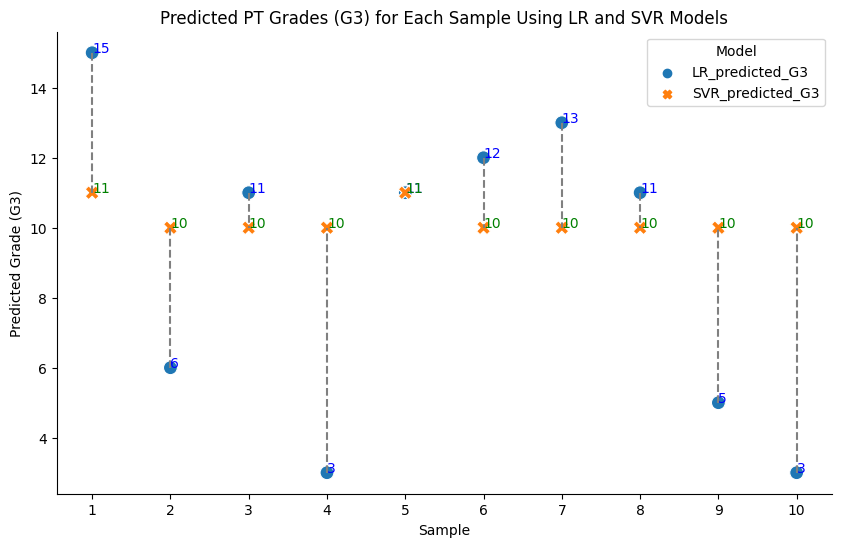

In [78]:
# Creating a long-form DataFrame for Plotting
long_data = pd.melt(data.reset_index(), id_vars='index', value_vars=['LR_predicted_G3', 'SVR_predicted_G3'], 
                    var_name='model', value_name='predicted_G3')

# Adjusting index for 1-based sample numbering
long_data['index'] += 1

# Plotting the points for predicted G3 grades using seaborn
plt.figure(figsize=(10, 6))
sns.scatterplot(data=long_data, x='index', y='predicted_G3', hue='model', style='model', palette='tab10', s=100)

# Drawing lines connecting predicted G3 grades for each model
for i in range(1, len(data) + 1):
    plt.plot([i, i], [data.loc[i-1, 'LR_predicted_G3'], data.loc[i-1, 'SVR_predicted_G3']], color='gray', linestyle='--')
    # Annotating the points with their integer values
    plt.text(i, data.loc[i-1, 'LR_predicted_G3'], f"{int(data.loc[i-1, 'LR_predicted_G3'])}", 
             horizontalalignment='left', size='medium', color='blue')
    plt.text(i, data.loc[i-1, 'SVR_predicted_G3'], f"{int(data.loc[i-1, 'SVR_predicted_G3'])}", 
             horizontalalignment='left', size='medium', color='green')

# Customising plot 
plt.title('Predicted PT Grades (G3) for Each Sample Using LR and SVR Models')
plt.xlabel('Sample')
plt.ylabel('Predicted Grade (G3)')
plt.legend(title='Model')
plt.grid(False)
sns.despine()
plt.xticks(range(1, len(data) + 1))
plt.show()

In [79]:
# Selecting random samples from df_2
random_samples = df_2.sample(n=10, random_state=42)

# Retrieving initial index from df_2 before resetting index
initial_indices = random_samples.index.tolist()

# Separating features and target
X_sample = random_samples.drop(columns=['G3'])
y_sample_actual = random_samples['G3']

# Scaling the features
X_sample_scaled = scaler.transform(X_sample)

# Predicting using Linear Regression and SVR
y_sample_pred_lr = lr_model.predict(X_sample_scaled)
y_sample_pred_svr = svr_model.predict(X_sample_scaled)

# Clipping and converting predictions to integers if necessary
y_sample_pred_lr = [int(min(max(0, grade), 20)) for grade in y_sample_pred_lr]
y_sample_pred_svr = [int(min(max(0, grade), 20)) for grade in y_sample_pred_svr]

# Creating a DataFrame to display actual vs predicted
comparison_df = pd.DataFrame({
    'Actual Grade': y_sample_actual,
    'LR Predicted Grade': y_sample_pred_lr,
    'SVR Predicted Grade': y_sample_pred_svr
})

# Displaying the results
print("Comparison of Actual and Predicted Grades:")
comparison_df

Comparison of Actual and Predicted Grades:


,Actual Grade,LR Predicted Grade,SVR Predicted Grade
636,19,18,16
220,12,11,11
594,18,18,17
429,11,11,11
72,11,11,11
448,17,16,16
181,18,17,17
131,8,8,8
231,10,10,10
277,11,10,10


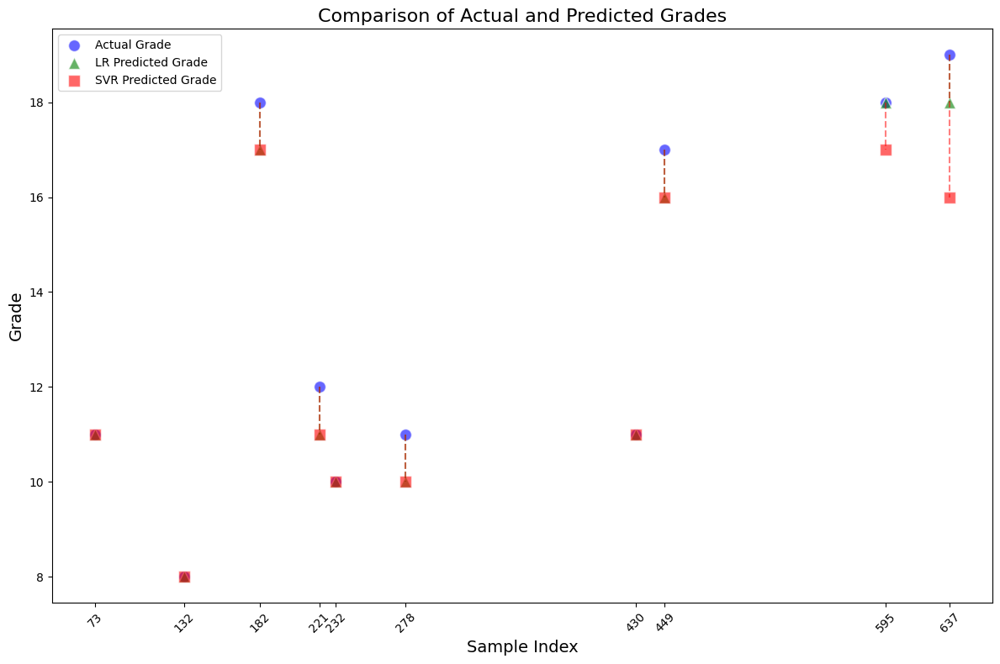

In [80]:
# Plotting the comparison data
plt.figure(figsize=(12, 8))

# Plotting Actual Grades
plt.scatter(comparison_df.index, comparison_df['Actual Grade'], color='blue', label='Actual Grade', alpha=0.6, edgecolors='w', s=100)

# Plotting LR Predicted Grades
plt.scatter(comparison_df.index, comparison_df['LR Predicted Grade'], color='green', label='LR Predicted Grade', marker='^', alpha=0.6, edgecolors='w', s=100)

# Plotting SVR Predicted Grades
plt.scatter(comparison_df.index, comparison_df['SVR Predicted Grade'], color='red', label='SVR Predicted Grade', marker='s', alpha=0.6, edgecolors='w', s=100)

# Drawing dashed lines between actual and predicted grades for each sample
for i in comparison_df.index:
    plt.plot([i, i], [comparison_df.loc[i, 'Actual Grade'], comparison_df.loc[i, 'LR Predicted Grade']], 'g--', alpha=0.5)
    plt.plot([i, i], [comparison_df.loc[i, 'Actual Grade'], comparison_df.loc[i, 'SVR Predicted Grade']], 'r--', alpha=0.5)

# Adding title and labels
plt.title('Comparison of Actual and Predicted Grades', fontsize=16)
plt.xlabel('Sample Index', fontsize=14)
plt.ylabel('Grade', fontsize=14)
plt.xticks(comparison_df.index, labels=[f"{idx+1}" for idx in comparison_df.index], rotation=45)
plt.legend()

# Show plot
plt.tight_layout()
plt.show()
